# 🧬 <font color='red'>**Welcome to the 2025 Biocatalyst Interactions with Gases (BIG) Symposium Collabortutorial B: Cloud-based Molecular Dynamics Simulations**</font>

This **Jupyter notebook** is part of a collaborative educational session designed to introduce researchers and students to **molecular dynamics (MD) simulations** using the **Assisted Model Building with Energy Refinement (AMBER) software package** and **AMBER force fields**, all within a **cloud-enabled Google Colab environment**.

> This resource is **adapted and expanded** from the excellent pipeline originally presented in the paper **[Making it Rain: Cloud-based Molecular Simulations for Everyone](https://doi.org/10.1021/acs.jcim.1c00998)** by Pablo R. Arantes et al. The original notebook, from Arantes et al., is available at https://pablo-arantes.github.io/making-it-rain/ > "AMBER".

---

### ⚠️ **Disclaimer**

> **This notebook is not a substitute for a full MD protocol.**  
> Instead, it is a learning-focused implementation that walks through every major step of preparing, solvating, neutralizing, and simulating a biomolecular system — with visualization tools and best-practice commentary.

---

### ✨ **Customization & Support**

This notebook has been **significantly modified** from the original to incorporate the following:

- Force field/parameter flexibility (e.g., `ff14SB` or `ff19SB` for proteins, `TIP3P` or `OPC` for water, etc.)
- Protonation-state editing (⚠️ This is not a fully validated protonation protocol.)
- Improvements for the addition of solvent and ions using `tleap`
- Extended visualization using `py3Dmol`
- File validation, further clarified outputs, and structured logs

**If you experience issues specifically with this notebook**, please reach out to:
- **Merve Fedai**: mfedai@ncsu.edu
- **Albert Kwansa**: alkwansa@ncsu.edu
- **Yaroslava Yingling**: ygyingli@ncsu.edu

---

### 💬 **Acknowledgements**

- Many thanks to **Pablo R. Arantes**, **Marcelo D. Polêto**, **Conrado Pedebos**, and **Rodrigo Ligabue-Braun** for their original work and openness in sharing it via their [Making-it-Rain GitHub Repository](https://github.com/pablo-arantes/making-it-rain).
- Credit to **David Koes** for his [py3Dmol](https://3dmol.csb.pitt.edu/) visualization library.
<!-- - Thanks also to the **OpenMM development team** for their exceptional open-source simulation engine. -->

---

🧭 Let's dive in — and simulate!


# 🧬 <font color='red'>**Introduction**</font>

**Molecular dynamics (MD) simulations** are widely used to investigate the structure, dynamics, and function of biological macromolecules. At their core, MD simulations require two essential components:

1. **Atomic coordinates** — defining the 3D structure of the molecular system (typically in the `PDB` format for proteins)
2. A **force field** — a potential energy equation and parameters that govern the interactions between atoms/particles (includes a set of bonded and non-bonded potential energy terms and associated parameters)

Below is the **potential energy equation** (aka functional form) for the AMBER force fields, including three **bonded terms** (bonds, angles, and dihedrals) and two **non-bonded terms** (a 12-6 Lennard-Jones (LJ) potential and a Coulombic potential); sometimes a 12-6-4 LJ potential is used with AMBER force fields to improve the modeling of multivalent ions (e.g., $Zn^{2+}$).

$$
E_{total}
= ∑_{bonds} K_r (r-r_{eq})^2
+ ∑_{angles} K_\theta (\theta-\theta_{eq})^2
+ ∑_{dihedrals} {V_n/2} [1 + cos(n\phi - \gamma)]
\\
+ \sum_{LJ} [A_{ij}/R{ij}^{12} - B_{ij}/R{ij}^{6}]
+ \sum_{Coulombic} [{q_i q_j}/(\varepsilon R_{ij})]
$$

Below is a list of associated **parameters**:

| Parameter       | Description             | Units            |
|-----------------|-------------------------|------------------|
| $K_r$           | Bond force constant     | kcal/mol/Å^2     |
| $r$             | Bond length             | Å                |
| $r_{eq}$        | Equilibrium bond length | Å                |
| $K_\theta$      | Angle force constant    | kcal/mol/rad^2   |
| $\theta$        | Angle                   | degrees          |
| $\theta_{eq}$   | Equilibrium angle       | degrees          |
| $V_n$           | Dihedral force constant | kcal/mol         |
| $n$             | Dihedral periodicity    | unitless         |
| $\phi$          | Dihedral angle          | degrees          |
| $\gamma$        | Phase angle             | degrees          |
| $A_{ij}$        | Repulsive coefficient   | kcal/mol*Å^12    |
| $B_{ij}$        | Attractive coefficient  | kcal/mol*Å^6     |
| $R_{ij}$        | Inter-atomic separation | Å                |
| $q_i, q_j$      | Atom partial charges    | e                |
| $\varepsilon$   | 4$\pi \varepsilon_0$    | F/m              |
| $\varepsilon_0$ | Vacuum permittivity     | F/m              |

Most of these **force field parameters** are typically derived from experimental data (X-ray structures, vibrational spectroscopy, etc.) and electronic structure/quantum mechanics calculations.

For the AMBER force fields, the **partial charge parameters** (q) are often derived via electronic structure calculations and charge fitting methods, e.g., Restrained Electrostatic Potential (RESP).

---

### 📦 **AMBER Input Requirements**

To run an MD simulation of a protein/peptide using the **AMBER** software package, we need the following:

- Structural file(s) (e.g., `.pdb` or a PDB ID from the Protein Data Bank) -- provides **atom names, residue names, residue ID numbers, and atom coordinates** (For further details about the PDB file format and standard, please see "https://www.wwpdb.org/documentation/file-format".)
- Library file(s) (e.g., `.lib` or `.off`) -- provides **atom types and partial charges** (based on matching information from the PDB file such as residue names and atom names)
- Force field parameter file(s) (e.g., `parm*.dat` and `.frcmod`) -- provides **all parameters except for the partial charges**

---

### 🧰 **System Preparation with LEaP**

We will use **LEaP**, the system preparation tool in AMBER, to:

- Load our molecule
- Apply appropriate force fields for the protein, water, ions, etc.
- Add solvent (explicit water box)
- Introduce counterions (to neutralize the net charge of the system) and additional ions (to optionally achieve a preferred ionic strength)

LEaP acts as a bridge between molecular structure formats and the AMBER parameter-topology file (`.parm7`) and AMBER coordinate file (`.rst7`).

🔗 [LEaP tutorial from the AMBER website](https://ambermd.org/tutorials/pengfei/index.php)  
📖 See also Section 1.1 of the [AMBER Reference Manual (PDF)](https://ambermd.org/Manuals.php)

---

### 🧪 **Example System: Bovine Carbonic Anhydrase (1V9E)**

Now, we will prepare and simulate **bovine carbonic anhydrase** (PDB ID: `1V9E`), a zinc-containing metalloenzyme that catalyzes the reversible hydration of carbon dioxide ($CO_2$) to/from bicarbonate ($HCO3^-$).

This tutorial will walk through the following:

- Retrieving and inspecting the PDB structure
- Cleaning and filtering atoms (e.g., water, hydrogens, and chains)
- Renaming residues for compatibility (e.g., "HIS" to "HIE"; please see https://ambermd.org/Questions/HIS.html)
- Preparing the system using LEaP
- Solvating and ionizing the system
- Visualizing and analyzing the final structure

Let’s begin by preparing our structure for an MD simulation.

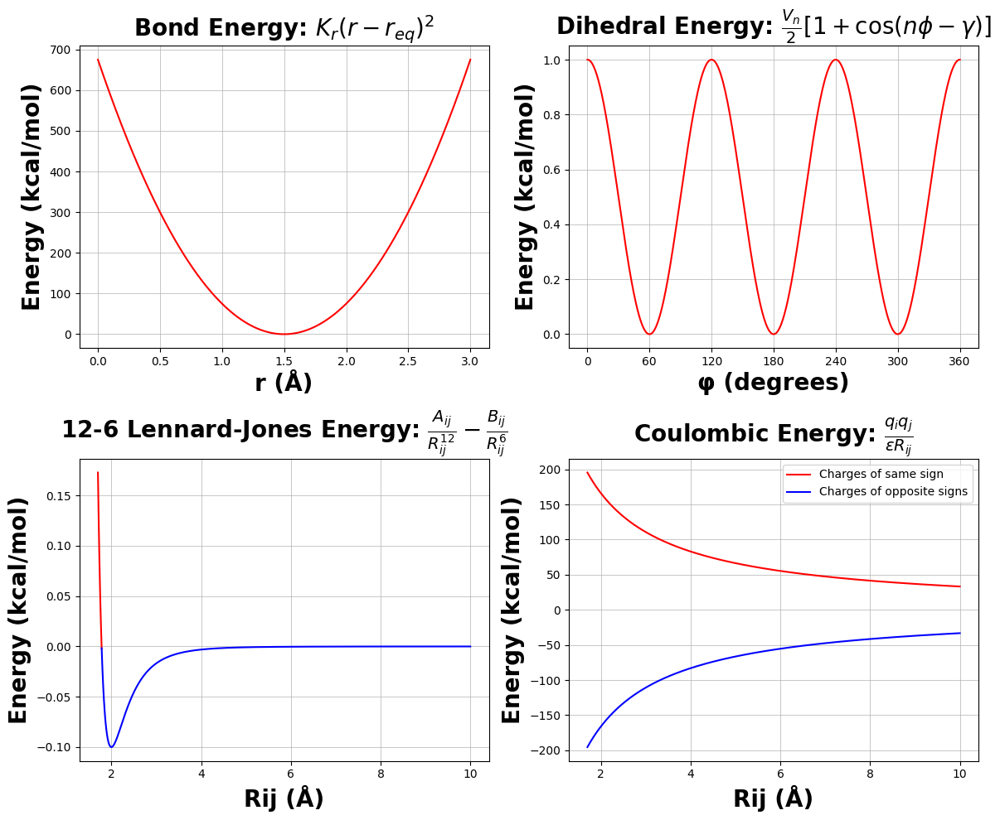

Mon Jun 02 08:06:34 AM 2025: Plotted representative potential energy terms


In [ ]:
#@title **Before proceeding, let's first plot some of the AMBER potential energy terms (<font color="blue">Run code here -- 1st code block</font>)**
#@markdown Here, we can see that all of the **bonded energy terms** have a minimum of zero and are otherwise <font color="red">positive</font>, due to restoring forces in the harmonic/spring-like interaction or periodic/cosine-based interaction. For the **12-6 LJ energy term**, there is <font color="red">repulsion (positive values)</font> at very short distances due to Pauli exclusion, and there is <font color="blue">attraction (negative values)</font> at longer distances due to van der Waals or induced-dipole interactions. For the **Coulombic energy term**, there are <font color="red">positive values</font> when the two atoms have partial charges of the same sign, and <font color="blue">negative values</font> when the two atoms have partial charges of opposite signs.

#@markdown The **non-bonded** contributions are the most computationally demanding contribution due to the pair-wise calculations that scale with O(n^2). Therefore, a **spherical cutoff** (e.g., AMBER's "cut" that defaults to 8.0 angstroms) is used to reduce the number of direct non-bonded calculations, and long-range non-bonded methods including **Particle-mesh Ewald (PME)** and **LJ Correction** are employed; these long-range methods are specifically for periodic simulations.

# Note: Python code generated partly through ChatGPT.

import matplotlib.pyplot as plt
import numpy as np

# Define distance/angle/dihedral range
r = np.linspace(0.0, 3.0, 500)     # bond length in angstroms
theta = np.linspace(60, 180, 500)  # angle in degrees
phi = np.linspace(0, 360, 500)     # dihedral angle in degrees
rij = np.linspace(1.7, 10.0, 500)  # interatomic distance for nonbonded

# Parameters
# Bond
K_r = 300.0 # kcal/mol·Å²
r_eq = 1.5  # Å

# Angle
K_theta = 60.0   # kcal/mol·rad²
theta_eq = 110.0 # degrees
theta_rad = np.radians(theta)
theta_eq_rad = np.radians(theta_eq)

# Dihedral
Vn = 1.0  # kcal/mol
n = 3     # unitless
gamma = 0 # degrees
phi_rad = np.radians(phi)

# Lennard-Jones
Rminij = 2.0 # Interatomic separation at LJ energy minimum (Å)
epsij = 0.1  # LJ energy minimum/energy well depth (kcal/mol)
A = epsij*Rminij**12
B = 2*epsij*Rminij**6

# Coulombic
ec = 1.602176634*10**-19        # elementary charge (C, https://physics.nist.gov/cgi-bin/cuu/Value?e)
qi = 1*ec                       # partial charge of atom i (e)
qj = 1*ec                       # partial charge of atom j (e)
na = 6.02214076*10**23          # Avogadro constant (mol^-1, https://physics.nist.gov/cgi-bin/cuu/Value?na)
epsilon_0 = 8.854187817*10**-12 # electric constant (F/m = C^2/(N*m^2), http://physics.nist.gov/cgi-bin/cuu/Value?ep0)
epsilon = (4*3.14*epsilon_0)    # 1/Coulomb constant
joulestokcals = 1/4184          # kcal/J
angstromstometers = 1.0*10**-10 # meters/angstrom

# Compute energies
bond_energy = K_r * (r - r_eq)**2
angle_energy = K_theta * (theta_rad - theta_eq_rad)**2
dihedral_energy = 0.5 * Vn * (1 + np.cos(n * phi_rad - np.radians(gamma)))
lj_energy = A / rij**12 - B / rij**6
coulomb_energy1 = (qi * qj) / (epsilon * rij * angstromstometers) * na * joulestokcals
coulomb_energy2 = (qi * -qj) / (epsilon * rij * angstromstometers) * na * joulestokcals

# Plotting
fig, axs = plt.subplots(2, 2, figsize=(12, 10))
fs = 20 # font size

# Bond Energy
axs[0, 0].plot(r, bond_energy, 'r')
axs[0, 0].set_title("Bond Energy: $K_r (r - r_{eq})^2$", fontsize=fs, fontweight='bold')
axs[0, 0].set_xlabel("r (Å)", fontsize=fs, fontweight='bold')
axs[0, 0].set_ylabel("Energy (kcal/mol)", fontsize=fs, fontweight='bold')
axs[0, 0].grid(linewidth = 0.5)

# Dihedral Energy
axs[0, 1].plot(phi, dihedral_energy, 'r')
axs[0, 1].set_title("Dihedral Energy: $\\frac{V_n}{2}[1 + \\cos(n\\phi - \\gamma)]$", fontsize=fs, fontweight='bold')
axs[0, 1].set_xlabel("φ (degrees)", fontsize=fs, fontweight='bold')
axs[0, 1].set_ylabel("Energy (kcal/mol)", fontsize=fs, fontweight='bold')
axs[0, 1].grid(linewidth = 0.5)
axs[0, 1].set_xticks(np.arange(0, 360+1, 60))

# Lennard-Jones Energy
axs[1, 0].plot(rij[0:6], lj_energy[0:6], 'r')
axs[1, 0].plot(rij[5:500], lj_energy[5:500], 'b')
axs[1, 0].set_title("12-6 Lennard-Jones Energy: $\\frac{A_{ij}}{R_{ij}^{12}} - \\frac{B_{ij}}{R_{ij}^6}$", fontsize=fs, fontweight='bold')
axs[1, 0].set_xlabel("Rij (Å)", fontsize=fs, fontweight='bold')
axs[1, 0].set_ylabel("Energy (kcal/mol)", fontsize=fs, fontweight='bold')
axs[1, 0].grid(linewidth = 0.5)

# Coulombic Energy
axs[1, 1].plot(rij, coulomb_energy1, 'r')
axs[1, 1].plot(rij, coulomb_energy2, 'b')
axs[1, 1].set_title("Coulombic Energy: $\\frac{q_i q_j}{\\varepsilon R_{ij}}$", fontsize=fs, fontweight='bold')
axs[1, 1].set_xlabel("Rij (Å)", fontsize=fs, fontweight='bold')
axs[1, 1].set_ylabel("Energy (kcal/mol)", fontsize=fs, fontweight='bold')
axs[1, 1].legend(['Charges of same sign', 'Charges of opposite signs'])
axs[1, 1].grid(linewidth = 0.5)

plt.tight_layout()
plt.show()

# Print timestamp
from datetime import datetime
from zoneinfo import ZoneInfo
now = datetime.now(ZoneInfo("America/New_York"))
timestamp = now.strftime("%a %b %d %I:%M:%S %p %Y")
print('%s: Plotted representative potential energy terms' % timestamp)


---
---
# ⚙️ <font color='red'>**Setting Up the Environment for an MD Simulation**</font>

Before we begin building and running our MD simulation, we must ensure that all necessary libraries and tools are installed in our environment. These packages will allow us to prepare the system, perform the simulation, and visualize/analyze the results.

### 🧰 **Required Packages and Tools**

| Package | Purpose |
|--------|---------|
| [**Miniconda**](https://docs.conda.io/en/latest/miniconda.html) | Lightweight package manager used to install dependencies and manage environments |
| [**AmberTools**](https://ambermd.org/AmberTools.php) | Provides key tools such as `LEaP`, `cpptraj`, `pdb4amber`, and file format utilities |
| [**PyTraj**](https://amber-md.github.io/pytraj/latest/index.html) | Python interface to `cpptraj` for trajectory manipulation and analysis |
| [**py3Dmol**](https://pypi.org/project/py3Dmol/) | Lightweight molecular viewer used to visualize protein structures directly in notebooks |
| [**NumPy**](https://numpy.org/) | Numerical computing library used in all stages of data processing |
| [**Matplotlib**](https://matplotlib.org/) | Library for plotting graphs, histograms, and simulation trends |

<!-- | [**OpenMM**](https://openmm.org/) | High-performance MD engine used for GPU-accelerated simulations | -->

We will install these using `mamba` (a package manager similar to `conda`) and `pip` (a package manager for Python) to ensure compatibility within the Jupyter notebook and Google Colab environment.

⏳ **This step may take several minutes** depending on your network and runtime configuration.

Let’s proceed to install the full environment.


In [ ]:
#@title 🐍 **Install Conda Environment in Colab (<font color="blue">Run code here</font>)**
#@markdown This step will install Conda in your Colab session using [condacolab](https://github.com/conda-incubator/condacolab).
#@markdown > ⚠️ **Note**: This will restart the runtime kernel — no need to worry, one can just proceed with running the next cells after this cell completes.

# Install Conda via CondaColab and restart kernel
!pip install -q condacolab
import condacolab
condacolab.install()

# Print timestamp
from datetime import datetime
from zoneinfo import ZoneInfo
now = datetime.now(ZoneInfo("America/New_York"))
timestamp = now.strftime("%a %b %d %I:%M:%S %p %Y")
print('%s: Installed Conda environment' % timestamp)


⏬ Downloading https://github.com/jaimergp/miniforge/releases/download/24.11.2-1_colab/Miniforge3-colab-24.11.2-1_colab-Linux-x86_64.sh...
📦 Installing...
📌 Adjusting configuration...
🩹 Patching environment...
⏲ Done in 0:00:13
🔁 Restarting kernel...
Mon Jun 02 07:33:34 AM 2025: Installed Conda environment


In [ ]:
#@title 🐍 **Check for available versions and builds of AmberTools via `mamba` (<font color="blue">Run code here</font>)**
#@markdown By default, `mamba` currently installs AmberTools 24 without a message-passing interface (MPI, e.g.,  MPICH or Open MPI) and without CUDA (GPU acceleration). There are other AmberTools versions and builds available with MPI and/or CUDA; however, for MD simulation programs, AmberTools includes the CPU-only serial SANDER program (`sander`) and the MPI-accelerated SANDER (`sander.MPI`). The serial, MPI-accelerated, and CUDA-accelerated PMEMD programs (`pmemd`, `pmemd.MPI`, and `pmemd.cuda`) are available through the licensed component of AMBER.

import subprocess

# Run "mamba search ... ambertools"
command = "mamba search -c conda-forge ambertools"
result = subprocess.run(command, shell=True, capture_output=True, text=True)
print(result.stdout)

# Print timestamp
from datetime import datetime
from zoneinfo import ZoneInfo
now = datetime.now(ZoneInfo("America/New_York"))
timestamp = now.strftime("%a %b %d %I:%M:%S %p %Y")
print('%s: Checked for available AmberTools versions' % timestamp)


Loading channels: - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - done
# Name                       Version           Build  Channel             
ambertools                        19      h0d7ec52_0  conda-forge         
ambertools                      19.0  py36h5dc2433_0  conda-forge         
ambertools                        19  py36h5dc2433_1  conda-forge         
ambertools                        19  py36h5dc2433_2  conda-forge         
ambertools                        19  py36h5dc2433_3  conda-forge         
ambertools                      19.0  py37h5dc2433_0  conda-forge         
ambertools                        19  py37h5dc2433_1  conda-forge         
ambertools                        19  py37h5dc2433_2  conda-forge         
ambertools

In [ ]:
#@title **Install dependencies (<font color="blue">Run code here</font>)**
#@markdown This step should take a few minutes. Please wait until it completes this step.

import subprocess
import sys

def run_with_message(description, command, use_shell=True):
    print(f"🔄 {description}...")
    result = subprocess.run(command, shell=use_shell, capture_output=True, text=True)
    if result.returncode == 0:
        print(f"✅ {description} completed.\n")
    else:
        print(f"❌ {description} failed.")
        print(result.stderr)
        raise RuntimeError(f"Step failed: {description}")

# Step-by-step installation and cleanup
run_with_message("Removing pinned conda packages (if any)", "rm -rf /usr/local/conda-meta/pinned")
run_with_message("Installing AmberTools (this might take a few minutes)", "mamba install -c conda-forge ambertools=*=cuda_*_openmpi* -y")
run_with_message("Installing py3Dmol", "pip install -q py3Dmol")
run_with_message("Installing patched BioPandas from GitHub", "pip install git+https://github.com/pablo-arantes/biopandas")
run_with_message("Installing OpenMM via mamba", "mamba install openmm -y")
run_with_message("Installing or upgrading MDAnalysis", "pip install --upgrade MDAnalysis")

# === Load Dependencies ===
print("📦 Loading Python modules...")
import os
import sys
import urllib.request
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sb
import py3Dmol
import pytraj as pt
import platform

from biopandas.pdb import PandasPdb
import openmm as mm
from openmm import *
from openmm.app import *
from openmm.unit import *

import MDAnalysis as mda
from IPython.display import set_matplotlib_formats
import scipy.stats as stats
import scipy.cluster.hierarchy
from scipy.spatial.distance import squareform
from statistics import mean, stdev
from pytraj import matrix
from matplotlib import colors
from scipy.interpolate import griddata

print("✅ All dependencies installed and loaded successfully!")

# Print timestamp
from datetime import datetime
from zoneinfo import ZoneInfo
now = datetime.now(ZoneInfo("America/New_York"))
timestamp = now.strftime("%a %b %d %I:%M:%S %p %Y")
print('%s: Installed dependencies' % timestamp)


🔄 Removing pinned conda packages (if any)...
✅ Removing pinned conda packages (if any) completed.

🔄 Installing AmberTools (this might take a few minutes)...
✅ Installing AmberTools (this might take a few minutes) completed.

🔄 Installing py3Dmol...
✅ Installing py3Dmol completed.

🔄 Installing patched BioPandas from GitHub...
✅ Installing patched BioPandas from GitHub completed.

🔄 Installing OpenMM via mamba...
✅ Installing OpenMM via mamba completed.

🔄 Installing or upgrading MDAnalysis...
✅ Installing or upgrading MDAnalysis completed.

📦 Loading Python modules...
✅ All dependencies installed and loaded successfully!
Mon Jun 02 07:48:16 AM 2025: Installed dependencies


In [ ]:
#@title **Check versions of selected programs (<font color="blue">Run code here</font>)**

!echo "AmberTools version & build:"
!mamba list ambertools

!echo -e "\nPython version:"
!python --version

!echo -e "\nMPI implementation (Open MPI or MPICH) & version:"
!mpirun --version

!echo -e "\nCheck for selected AmberTools programs and files:"
!which sander sander.MPI cpptraj cpptraj.MPI cpptraj.cuda
!ls /usr/local/dat/leap/parm/lj_1264_pol.dat

# Print timestamp
from datetime import datetime
from zoneinfo import ZoneInfo
now = datetime.now(ZoneInfo("America/New_York"))
timestamp = now.strftime("%a %b %d %I:%M:%S %p %Y")
print('%s: Additional post-installation checks' % timestamp)


AmberTools version & build:
# packages in environment at /usr/local:
#
# Name                    Version                   Build  Channel
ambertools                24.8            cuda_None_openmpi_py311h18aca14_1    conda-forge

Python version:
Python 3.11.11

MPI implementation (Open MPI or MPICH) & version:
mpirun (Open MPI) 5.0.7

Report bugs to https://www.open-mpi.org/community/help/


Check for selected AmberTools programs and files:
/usr/local/bin/sander
/usr/local/bin/sander.MPI
/usr/local/bin/cpptraj
/usr/local/bin/cpptraj.MPI
/usr/local/dat/leap/parm/lj_1264_pol.dat
Mon Jun 02 07:51:29 AM 2025: Additional post-installation checks


## **Using Google Drive to store simulation data**

Google Colab does not allow users to keep data on their compute nodes/servers. However, we can use Google Drive to read, write, and store our simulation files. Therefore, the following are suggested:

1.   **Create a new folder** in your Google Drive, and copy the necessary input files there. By default, this notebook assumes that this new folder is called "**AMBER_PDBtoMD**" located under "My Drive".
2.   We will **confirm the path to this folder below**. If you may prefer to use a different folder name, one will just need to update the path to this folder.

In [ ]:
#@title ### **Connect to Google Drive (<font color="blue">Run code here</font>)**
#@markdown Click on the run button to make your Google Drive accessible.
from google.colab import drive

drive.flush_and_unmount()
drive.mount('/content/drive', force_remount=True)

# Print timestamp
from datetime import datetime
from zoneinfo import ZoneInfo
now = datetime.now(ZoneInfo("America/New_York"))
timestamp = now.strftime("%a %b %d %I:%M:%S %p %Y")
print('%s: Connected to Google Drive' % timestamp)


Drive not mounted, so nothing to flush and unmount.
Mounted at /content/drive
Mon Jun 02 07:51:54 AM 2025: Connected to Google Drive


In [ ]:
#@title **Check for NVIDIA graphics processing unit (GPU) access (<font color="blue">Run code here</font>)**
#@markdown GPUs are not needed for this particular notebook, since the MD simulations set up below use CPU-only programs from AmberTools (`sander` or `sander.MPI`); however, if one were using a GPU-accelerated program (e.g., AMBER's `pmemd.cuda`), this cell could be used to obtain further information about the available GPU(s). If one is connected to a CPU-only runtime type (e.g., CPU or TPU), it is expected to see `nvidia-smi: command not found` in the output below.

gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Select the Runtime > "Change runtime type" menu to enable a GPU accelerator, ')
  print('and then re-execute this cell.')
else:
  print(gpu_info)

# Print timestamp
from datetime import datetime
from zoneinfo import ZoneInfo
now = datetime.now(ZoneInfo("America/New_York"))
timestamp = now.strftime("%a %b %d %I:%M:%S %p %Y")
print('%s: Tested GPU access' % timestamp)

/bin/bash: line 1: nvidia-smi: command not found
Mon Jun 02 07:52:10 AM 2025: Tested GPU access


---
---
# <font color='red'>**Load the input files, prepare the system, and run the MD simulation**</font>

Below, please provide the path of your Google Drive folder that you'd like to use to store inputs and outputs for this notebook. Please do not use spaces in the folder name; one can use underscores or hyphens instead.

In [ ]:
#@title **Step 1: Select PDB ID and View Full Structure Summary with Sequences (<font color="blue">Run code here</font>)**
import os, urllib.request, json, requests
from biopandas.pdb import PandasPdb
from IPython.display import display, Markdown

# --- User Input ---
Query_PDB_ID = '1V9E'  #@param {type:"string"}
Google_Drive_Path = '/content/drive/MyDrive/AMBER_PDBtoMD'  #@param {type:"string"}

pdb_id = Query_PDB_ID.strip().upper()
workDir = Google_Drive_Path
pdbfn = pdb_id + ".pdb"
pdb_path = os.path.join(workDir, pdbfn)

# === Download the PDB file ===
urllib.request.urlretrieve(f'https://files.rcsb.org/download/{pdbfn}', pdb_path)

# === Parse chains using biopandas ===
ppdb = PandasPdb().read_pdb(pdb_path)
atom_chains   = set(ppdb.df['ATOM']['chain_id'].unique())
hetatm_chains = set(ppdb.df['HETATM']['chain_id'].unique())
available_chains = sorted(atom_chains | hetatm_chains)

# === Save for downstream use ===
with open(os.path.join(workDir, "selected_pdb.txt"), "w") as f:
    f.write(pdb_id)

# === GraphQL query to fetch metadata & sequences ===
graphql_query = """
query GetEntry($id: String!) {
  entry(entry_id: $id) {
    struct {
      title
    }
    exptl {
      method
    }
    rcsb_entry_info {
      molecular_weight
      deposited_atom_count
    }
    assemblies {
      rcsb_struct_symmetry {
        kind
        symbol
        stoichiometry
        oligomeric_state
      }
    }
    rcsb_primary_citation {
      rcsb_authors
      journal_abbrev
      year
      pdbx_database_id_DOI
    }
    polymer_entities {
      rcsb_polymer_entity {
        pdbx_description
      }
      rcsb_polymer_entity_container_identifiers {
        auth_asym_ids
      }
      entity_poly {
        rcsb_sample_sequence_length
        pdbx_seq_one_letter_code_can
      }
      rcsb_entity_source_organism {
        scientific_name
      }
    }
  }
}
"""

# === Fetch from RCSB GraphQL API ===
response = requests.post(
    "https://data.rcsb.org/graphql",
    json={"query": graphql_query, "variables": {"id": pdb_id}},
    headers={"Content-Type": "application/json"}
)

# === Handle API response safely ===
try:
    json_data = response.json()
    if "errors" in json_data:
        raise ValueError(f"GraphQL query returned errors:\n{json_data['errors']}")
    data = json_data["data"]["entry"]
except Exception as e:
    print("❌ Failed to fetch metadata:")
    print(e)
    print("Raw response:")
    print(response.text)
    raise SystemExit()

# === Extract general metadata ===
title       = data.get("struct", {}).get("title", "N/A")
method      = data.get("exptl", [{}])[0].get("method", "N/A")
mol_weight  = data.get("rcsb_entry_info", {}).get("molecular_weight", "N/A")
atom_count  = data.get("rcsb_entry_info", {}).get("deposited_atom_count", "N/A")

# Assembly info
assembly    = data.get("assemblies", [{}])[0].get("rcsb_struct_symmetry", [{}])[0]
oligomeric  = assembly.get("oligomeric_state", "N/A")
symmetry    = assembly.get("symbol", "N/A")
stoich      = assembly.get("stoichiometry", "N/A")

# Citation
citation = data.get("rcsb_primary_citation", {})
authors = ", ".join(citation.get("rcsb_authors", [])) or "N/A"
journal = citation.get("journal_abbrev", "N/A")
year = citation.get("year", "N/A")
doi = citation.get("pdbx_database_id_DOI", "N/A")

# === Display enriched summary ===
display(Markdown(f"## 🧬 Structure Summary for `{pdb_id}`"))
display(Markdown(f"**📌 Title:** {title}"))
display(Markdown(f"**🧪 Method:** {method}"))
display(Markdown(f"**🧩 Assembly:** {oligomeric}"))
display(Markdown(f"**🔄 Symmetry:** {symmetry} | **Stoichiometry:** {stoich}"))

display(Markdown("### 📦 Structure Content"))
display(Markdown(f"- **Molecular Weight:** {mol_weight} kDa"))
display(Markdown(f"- **Atom Count:** {atom_count}"))

# === Polymer info + sequences ===
display(Markdown("### 🔗 Molecules and Chains"))
entities = data.get("polymer_entities", [])
for ent in entities:
    desc     = ent.get("rcsb_polymer_entity", {}).get("pdbx_description", "N/A")
    chains   = ", ".join(ent.get("rcsb_polymer_entity_container_identifiers", {}).get("auth_asym_ids", []))
    length   = ent.get("entity_poly", {}).get("rcsb_sample_sequence_length", "N/A")
    sequence = ent.get("entity_poly", {}).get("pdbx_seq_one_letter_code_can", "N/A")
    organism = ent.get("rcsb_entity_source_organism", [{}])[0].get("scientific_name", "N/A")

    display(Markdown(f"**Molecule:** *{desc}*"))
    display(Markdown(f"- Chains: `{chains}`"))
    display(Markdown(f"- Sequence Length: {length} residues"))
    display(Markdown(f"- Organism: *{organism}*"))
    display(Markdown(f"- Sequence:\n\n```\n{sequence}\n```"))

# === Citation ===
display(Markdown("### 📖 Citation"))
display(Markdown(f"- **Authors:** {authors} ({year})"))
display(Markdown(f"- **Journal:** {journal}"))
if doi != "N/A":
    display(Markdown(f"- **DOI:** [https://doi.org/{doi}](https://doi.org/{doi})"))

# Print timestamp
from datetime import datetime
from zoneinfo import ZoneInfo
now = datetime.now(ZoneInfo("America/New_York"))
timestamp = now.strftime("%a %b %d %I:%M:%S %p %Y")
print('%s: Downloaded PDB file and printed associated information' % timestamp)


## 🧬 Structure Summary for `1V9E`

**📌 Title:** Crystal Structure Analysis of Bovine Carbonic Anhydrase II

**🧪 Method:** X-RAY DIFFRACTION

**🧩 Assembly:** Monomer

**🔄 Symmetry:** C1 | **Stoichiometry:** ['A1']

### 📦 Structure Content

- **Molecular Weight:** 58.17 kDa

- **Atom Count:** 4686

### 🔗 Molecules and Chains

**Molecule:** *Carbonic anhydrase II*

- Chains: `A, B`

- Sequence Length: 259 residues

- Organism: *Bos taurus*

- Sequence:

```
SHHWGYGKHNGPEHWHKDFPIANGERQSPVDIDTKAVVQDPALKPLALVYGEATSRRMVNNGHSFNVEYDDSQDKAVLKDGPLTGTYRLVQFHFHWGSSDDQGSEHTVDRKKYAAELHLVHWNTKYGDFGTAAQQPDGLAVVGVFLKVGDANPALQKVLDALDSIKTKGKSTDFPNFDPGSLLPNVLDYWTYPGSLTTPPLLESVTWIVLKEPISVSSQQMLKFRTLNFNAEGEPELLMLANWRPAQPLKNRQVRGFPK
```

### 📖 Citation

- **Authors:** Saito, R., Sato, T., Ikai, A., Tanaka, N. (2004)

- **Journal:** Acta Crystallogr.,Sect.D

- **DOI:** [https://doi.org/10.1107/S0907444904003166](https://doi.org/10.1107/S0907444904003166)

Mon Jun 02 07:57:09 AM 2025: Downloaded PDB file and printed associated information


In [ ]:
#@title **Step 2: Choose Chains to Keep and Remove Water Option (<font color="blue">Run code here</font>)**
import os, subprocess, re
from collections import defaultdict, Counter
from IPython.display import display, Markdown
from biopandas.pdb import PandasPdb

# === Load PDB ID from Step 1 ===
with open(os.path.join(Google_Drive_Path, "selected_pdb.txt"), "r") as f:
    Query_PDB_ID = f.read().strip().upper()

pdbfn = Query_PDB_ID + ".pdb"
pdb_path = os.path.join(Google_Drive_Path, pdbfn)
ppdb = PandasPdb().read_pdb(pdb_path)

# === User input ===
selected_chains_str = "A"  #@param {type:"string"}
selected_chains = [chain.strip() for chain in selected_chains_str.split(",")]
remove_waters = "yes"  #@param ["yes", "no"]
no_waters = 'nowat' if remove_waters == "yes" else ''

# === Output file names ===
out1 = os.path.join(Google_Drive_Path, f"{Query_PDB_ID}_query_1.pdb")
out2 = os.path.join(Google_Drive_Path, f"{Query_PDB_ID}_query_2.pdb")
out3 = os.path.join(Google_Drive_Path, f"{Query_PDB_ID}_query_3.pdb")
out4 = os.path.join(Google_Drive_Path, f"{Query_PDB_ID}_query_4.pdb")
prepareforleap = os.path.join(Google_Drive_Path, "prepareforleap.in")

# === Filter ATOM ===
ppdb.df['ATOM'] = ppdb.df['ATOM'][
    (ppdb.df['ATOM']['chain_id'].isin(selected_chains)) &
    (ppdb.df['ATOM']['atom_name'] != 'OXT') &
    (ppdb.df['ATOM']['element_symbol'] != 'H')
]

# === Filter HETATM ===
valid_resnames = ['HOH', 'NA', 'CL', 'K', 'MG', 'CA', 'ZN','BCT','ACM','PG4','CO','CO2','CO3']
ppdb.df['HETATM'] = ppdb.df['HETATM'][
    (ppdb.df['HETATM']['chain_id'].isin(selected_chains)) &
    (ppdb.df['HETATM']['residue_name'].isin(valid_resnames))
]
if remove_waters == "yes":
    ppdb.df['HETATM'] = ppdb.df['HETATM'][ppdb.df['HETATM']['residue_name'] != 'HOH']

# === Write filtered structure ===
ppdb.to_pdb(path=out1, records=['ATOM', 'HETATM'], gz=False, append_newline=True)

# === Write cpptraj input ===
with open(prepareforleap, "w") as f:
    f.write(f"""parm {out1}
loadcrd {out1} name edited
prepareforleap crdset edited name from-prepareforleap \\
pdbout {out2} {no_waters} noh
go
""")

# === Run cpptraj ===
cpptraj_result = subprocess.run(["cpptraj", "-i", prepareforleap], capture_output=True, text=True)
cpptraj_stdout_text = cpptraj_result.stdout

print("✅ cpptraj stdout:\n", cpptraj_stdout_text)
print("⚠️ cpptraj stderr:\n", cpptraj_result.stderr)

# === Run pdb4amber ===
pdb4amber_result = subprocess.run(
    ["pdb4amber", "-i", out2, "-o", out3, "-a", "-y"],
    capture_output=True,
    text=True
)
print("✅ pdb4amber stdout:\n", pdb4amber_result.stdout)
print("⚠️ pdb4amber stderr:\n", pdb4amber_result.stderr)

# === Final cleanup (TER records) ===
def remove_lines(filename):
    standard_aa = {
        'ALA','ARG','ASN','ASP','CYS','GLN','GLU','GLY',
        'HIS','ILE','LEU','LYS','MET','PHE','PRO','SER',
        'THR','TRP','TYR','VAL','CYX', 'HIP', 'HIE', 'HID',
        'LYN', 'ASH', 'GLH'
    }

    def get_category(resname):
        if resname == "HOH":
            return "water"
        elif resname in standard_aa:
            return "protein"
        else:
            return "ion"

    with open(filename, 'r') as f:
        lines = f.readlines()

    output_lines = []
    for i, line in enumerate(lines):
        if not line.startswith(("ATOM", "HETATM")):
            continue
        if line.startswith("HETATM"):
            line = line.replace("HETATM", "ATOM  ", 1)
        output_lines.append(line)

        resname = line[17:20].strip()
        resid = line[22:26].strip()
        chain = line[21].strip()
        category = get_category(resname)

        next_line = lines[i+1] if i + 1 < len(lines) else "TER"
        next_resname = next_line[17:20].strip() if next_line.startswith(("ATOM", "HETATM")) else None
        next_resid = next_line[22:26].strip() if next_line.startswith(("ATOM", "HETATM")) else None
        next_chain = next_line[21].strip() if next_line.startswith(("ATOM", "HETATM")) else None
        next_category = get_category(next_resname) if next_resname else None

        if category == "protein" and (chain != next_chain or next_category != "protein"):
            output_lines.append("TER\n")
        elif category == "ion" and (resname != next_resname or resid != next_resid or chain != next_chain):
            output_lines.append("TER\n")
        elif category == "water" and (chain != next_chain or next_category != "water"):
            output_lines.append("TER\n")

    if not output_lines[-1].startswith("TER"):
        output_lines.append("TER\n")

    return output_lines

# === Write final cleaned file ===
if os.path.exists(out3):
    with open(out4, 'w') as out_file:
        for line in remove_lines(out3):
            out_file.write(line)
        out_file.write("END\n")
else:
    raise FileNotFoundError(f"❌ File not found: {out3}")

# === Residue summary ===
standard_aa = {
    'ALA', 'ARG', 'ASN', 'ASP', 'CYS', 'GLN', 'GLU', 'GLY',
    'HIS', 'ILE', 'LEU', 'LYS', 'MET', 'PHE', 'PRO', 'SER',
    'THR', 'TRP', 'TYR', 'VAL'
}
noncanonical_aa = {'CYX', 'HIP', 'HIE', 'HID', 'LYN', 'ASH', 'GLH'}
ion_list = {'NA', 'CL', 'K', 'MG', 'CA', 'ZN'}

res_per_chain = defaultdict(set)
ion_counts = Counter()
ligand_counts = Counter()
water_count = 0
noncanonical_counts = set()

with open(out4) as f:
    for line in f:
        if not line.startswith("ATOM"):
            continue
        resname = line[17:20].strip()
        chain = line[21].strip()
        resid = line[22:26].strip()

        if resname in standard_aa:
            res_per_chain[chain].add(resid)
        elif resname in ion_list:
            ion_counts[resname] += 1
        elif resname == 'HOH':
            water_count += 1
        elif resname in noncanonical_aa:
            noncanonical_counts.add((resname, resid, chain))
        else:
            ligand_counts[resname] += 1

# === Add ligand guesses from cpptraj stderr and pdb4amber stderr ===
ligand_warnings = set(re.findall(r"Potential problem\s+:\s+(\w+)_\d+_\w+", cpptraj_result.stderr))
pdb4amber_lines = pdb4amber_result.stderr.splitlines()
for i, line in enumerate(pdb4amber_lines):
    if "Non-standard-resnames" in line and i + 1 < len(pdb4amber_lines):
        for res in pdb4amber_lines[i + 1].split(","):
            ligand_warnings.add(res.strip())

for res in ligand_warnings:
    if res and res not in ligand_counts and res not in ion_list and res not in standard_aa and res not in noncanonical_aa:
        ligand_counts[res] += 1

# === Output disulfide detection ===
def parse_disulfide_bonds_from_cpptraj(output_text):
    pattern = r"Potential disulfide:\s+CYS\s+(\d+).*?to CYS\s+(\d+)"
    bond_pairs = []
    for match in re.finditer(pattern, output_text):
        res1, res2 = match.groups()
        bond_pairs.append((f"enzyme.{res1}.SG", f"enzyme.{res2}.SG"))
    return bond_pairs

disulfide_bonds = parse_disulfide_bonds_from_cpptraj(cpptraj_stdout_text)

# === Output summaries ===
display(Markdown("___"))
display(Markdown("## 📄 Output File Summary"))
display(Markdown(f"- `{os.path.basename(out1)}`: Filtered input structure"))
display(Markdown(f"- `{os.path.basename(out2)}`: Cleaned naming and hydrogen removal (cpptraj)"))
display(Markdown(f"- `{os.path.basename(out3)}`: PDB formatted by pdb4amber"))
display(Markdown(f"- `{os.path.basename(out4)}`: Final PDB with TER records and relabeled ATOMs"))
display(Markdown("___"))

display(Markdown("## 🧪 Structure Composition Summary"))
for chain, residues in sorted(res_per_chain.items()):
    display(Markdown(f"- Chain `{chain}` contains **{len(residues)}** standard residues."))

if noncanonical_counts:
    display(Markdown("### ⚠️ Noncanonical Residues"))
    for resname, resid, chain in sorted(noncanonical_counts):
        display(Markdown(f"- `{resname}` at residue ID `{resid}` in chain `{chain}`"))

if ion_counts:
    display(Markdown("### 🧲 Ions Present"))
    for ion, count in ion_counts.items():
        display(Markdown(f"- `{ion}`: {count}"))

if ligand_counts:
    display(Markdown("### 💊 Ligands Present"))
    for ligand, count in ligand_counts.items():
        flagged = " ⚠️ No parameters" if ligand in ligand_warnings else ""
        display(Markdown(f"- `{ligand}`: {count}{flagged}"))

display(Markdown(f"### 💧 Water Molecules: `{water_count}`"))

if disulfide_bonds:
    display(Markdown("### 🔗 Summary of Disulfide Bonds"))
    for b1, b2 in disulfide_bonds:
        display(Markdown(f"- `{b1}` ↔ `{b2}`"))

# Print timestamp
from datetime import datetime
from zoneinfo import ZoneInfo
now = datetime.now(ZoneInfo("America/New_York"))
timestamp = now.strftime("%a %b %d %I:%M:%S %p %Y")
print('%s: Selected chain, followed by an optional removal of crystallographic water' % timestamp)


✅ cpptraj stdout:
 
CPPTRAJ: Trajectory Analysis. V6.24.0 (AmberTools)
    ___  ___  ___  ___
     | \/ | \/ | \/ | 
    _|_/\_|_/\_|_/\_|_

| Date/time: 06/02/25 02:54:07
| Available memory: 3.396 GB

INPUT: Reading input from '/content/drive/MyDrive/AMBER_PDBtoMD/prepareforleap.in'
  [parm /content/drive/MyDrive/AMBER_PDBtoMD/1V9E_query_1.pdb]
	Reading '/content/drive/MyDrive/AMBER_PDBtoMD/1V9E_query_1.pdb' as PDB File
	Reading bond info from CONECT records.
	Not reading bond info from LINK records.
	Determining bond info from distances.
  [loadcrd /content/drive/MyDrive/AMBER_PDBtoMD/1V9E_query_1.pdb name edited]
	Reading '/content/drive/MyDrive/AMBER_PDBtoMD/1V9E_query_1.pdb' as PDB
	Loading trajectory '/content/drive/MyDrive/AMBER_PDBtoMD/1V9E_query_1.pdb' as 'edited'
----- 1V9E_query_1.pdb (1-1, 1) -----
  [prepareforleap crdset edited name from-prepareforleap pdbout /content/drive/MyDrive/AMBER_PDBtoMD/1V9E_query_2.pdb nowat noh]
	PREPAREFORLEAP:
# Citation: Roe, D.R.; Bergonzo,

___

## 📄 Output File Summary

- `1V9E_query_1.pdb`: Filtered input structure

- `1V9E_query_2.pdb`: Cleaned naming and hydrogen removal (cpptraj)

- `1V9E_query_3.pdb`: PDB formatted by pdb4amber

- `1V9E_query_4.pdb`: Final PDB with TER records and relabeled ATOMs

___

## 🧪 Structure Composition Summary

- Chain `A` contains **259** standard residues.

### 🧲 Ions Present

- `ZN`: 1

### 💧 Water Molecules: `0`

Sun Jun 01 10:54:16 PM 2025: Selected chain, followed by an optional removal of crystallographic water


### **About the `⚠️ No parameters` Warning that May Appear for More Complex PDB Structures**

Some molecules in your PDB file — such as certain ions, cofactors, or ligands — may **not have parameters** defined in the standard AMBER force field library and parameter files. This warning indicates that the residue is **not automatically recognized** by LEaP and will likely prevent the parameter-topology (`parm7`) file from being generated.

### 🧪 What does this mean?

MD simulations require force field topology information and parameters for the following, as noted earlier:

- Atom types and connectivity
- Bond, angle, and dihedral parameters
- LJ parameters and partial charges

If a ligand (e.g., `PG4`, `BCT`, `ZN`) is unparameterized, **one would need to provide**:

- A `.lib`, `.off`, or `.mol2` file with atom types and partial charges
- A `.frcmod` file with force field parameters

### 🔧 What can you do?

- **Check if the ligand is needed:** Crystallization additives (e.g., `PG4`) can often be removed.
- For **partial charge parameters**, one could use tools/methods such as the following:
  - `antechamber` (includes a typically less-accurate but faster, semi-empirical Austin Model 1-Bond Charge Correction (AM1-BCC) method that may be advantageous for a large number of small molecule ligands)
  - `R.E.D. Server Development` (includes a typically higher-quality but more time-consuming, quantum mechanical electrostatic potential (ESP) + charge fitting method, suited for both small molecule ligands and polymer fragments)
- For **bond, angle, dihedral, and LJ parameters**, one could estimate missing parameters using tools/resources such as the following:
  - AMBER's `parmchk2` and existing AMBER parameter files to automatically estimate missing parameters, if the needed atom types already exist within AMBER
  - Available published parameters that are deemed to be compatible with the AMBER force fields
  - Assign and validate new atom types and their parameters from similar compounds or based on available data

📖 For further details, please see the [AMBER parameterization tutorials](https://ambermd.org/tutorials/ForceField.php).

If these missing parameters are not resolved, the necessary `.parm7` file will not be generated. Therefore, for simplicity for this tutorial, we have already removed these ligands from the PDB file.

In [ ]:
#@title **Step 3: Visualize Final Processed PDB + Residue Summary Table (<font color="blue">Run code here</font>)**
import py3Dmol  # Lightweight 3D molecular viewer for Python (Colab/Jupyter compatible)
import os
from collections import Counter
from IPython.display import display, Markdown

# Reuse PDB ID to locate the correct file
final_pdb = f"{Query_PDB_ID}_query_4.pdb"
pdb_path = os.path.join(Google_Drive_Path, final_pdb)

# Read the structure as a string (standard PDB format)
with open(pdb_path, 'r') as f:
    pdb_data = f.read()

# === Visualization Setup ===
view = py3Dmol.view(width=800, height=500)
view.addModel(pdb_data, 'pdb')

# Display protein as rainbow cartoon
view.setStyle({'cartoon': {'color': 'spectrum'}})

# Ions as colored spheres
ion_residues = ['ZN', 'CA', 'MG', 'K', 'NA', 'CL']
ion_colors = {
    'ZN': 'grey',
    'CA': 'lightblue',
    'MG': 'green',
    'K': 'violet',
    'NA': 'blue',
    'CL': 'green'
}
for resn in ion_residues:
    view.addStyle({'resn': resn}, {'sphere': {'radius': 1.0, 'color': ion_colors[resn]}})

# Waters as sticks + small spheres
view.addStyle({'resn': 'HOH'}, {'stick': {}, 'sphere': {'radius': 0.5}})

view.zoomTo()
view.show()

# === Residue Type Breakdown ===
residue_type_counts = Counter()
seen_residues = set()

for line in pdb_data.splitlines():
    if not line.startswith("ATOM"):
        continue
    resname = line[17:20].strip()
    resid   = line[22:26].strip()
    chain   = line[21].strip()
    key = (resname, resid, chain)
    if key not in seen_residues:
        residue_type_counts[resname] += 1
        seen_residues.add(key)

# Display the residue type breakdown as a horizontal Markdown table
display(Markdown("## 📊 Residue Type Breakdown"))
display(Markdown(f"**PDB ID:** `{Query_PDB_ID}`"))
sorted_residues = sorted(residue_type_counts.items(), key=lambda x: x[1], reverse=True)
table_pairs = ["| Residue | Count |  Residue | Count |", "|:-------:|:-----:|:--------:|:-----:|"]
for i in range(0, len(sorted_residues), 2):
    row = []
    for j in range(2):
        if i + j < len(sorted_residues):
            res, count = sorted_residues[i + j]
            row.extend([f"`{res}`", str(count)])
        else:
            row.extend(["", ""])
    table_pairs.append(f"| {row[0]} | {row[1]} | {row[2]} | {row[3]} |")

display(Markdown("\n".join(table_pairs)))

# Print timestamp
from datetime import datetime
from zoneinfo import ZoneInfo
now = datetime.now(ZoneInfo("America/New_York"))
timestamp = now.strftime("%a %b %d %I:%M:%S %p %Y")
print('%s: Generated a visualization and a residue table' % timestamp)


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

## 📊 Residue Type Breakdown

**PDB ID:** `1V9E`

| Residue | Count |  Residue | Count |
|:-------:|:-----:|:--------:|:-----:|
| `LEU` | 26 | `GLY` | 20 |
| `VAL` | 20 | `PRO` | 19 |
| `ASP` | 19 | `LYS` | 18 |
| `ALA` | 17 | `SER` | 16 |
| `THR` | 14 | `ASN` | 13 |
| `GLN` | 12 | `HIS` | 11 |
| `GLU` | 11 | `PHE` | 11 |
| `ARG` | 9 | `TYR` | 8 |
| `TRP` | 7 | `ILE` | 5 |
| `MET` | 3 | `ZN` | 1 |

Sun Jun 01 10:54:36 PM 2025: Generated a visualization and a residue table


In [ ]:
#@title **Step 4a: Protonation State Editing Using an External Tool or Skipping (<font color="blue">Run code here</font>)**
import os
import shutil
from IPython.display import Markdown, display

# === USER OPTION ===
Protonation_Mode = "Skip Editing"  #@param ["External: PDB2PQR (PropKa)", "External: H++", "Skip Editing"]

# === File paths ===
starting_pdb = os.path.join(Google_Drive_Path, f"{Query_PDB_ID}_query_4.pdb")
preprocessed_pdb = os.path.join(Google_Drive_Path, f"{Query_PDB_ID}_query_5.pdb")
pqr_path = os.path.join(Google_Drive_Path, f"{Query_PDB_ID}_propka.pqr")

# === Protonation Logic ===
if Protonation_Mode == "External: PDB2PQR (PropKa)":
    print("🌐 Please upload your structure to the **PDB2PQR PropKa Server**:")
    print("🔗 https://server.poissonboltzmann.org/pdb2pqr")
    print("✔️ Set your desired pH and download the resulting `.pqr` file.")
    print(f"💾 Rename it to:\n📁 `{os.path.basename(pqr_path)}`")
    print("⚠️ Do NOT manually convert `.pqr` to `.pdb` — this will be handled in Step 4b.")

elif Protonation_Mode == "External: H++":
    print("🌐 Submit your structure to the **H++ Protonation Server**:")
    print("🔗 https://biophysics.cs.vt.edu/H++/")
    print("✔️ After processing, download the `.pdb` file and rename it as:")
    print(f"📁 {preprocessed_pdb}")

else:  # Skip Editing
    print("⏭️ Skipping protonation editing. Copying original processed PDB to next step.")
    shutil.copy(starting_pdb, preprocessed_pdb)

# === Summary Table ===
display(Markdown(f"**🧬 PDB ID:** `{Query_PDB_ID}`"))
display(Markdown(
    f"### 📂 File expected in the next step:\n- `{os.path.basename(starting_pdb)}` (reference)\n- `{os.path.basename(pqr_path)}` (uploaded from PropKa)"
    if Protonation_Mode == "External: PDB2PQR (PropKa)"
    else f"### 📂 File used in next step:\n- `{os.path.basename(preprocessed_pdb)}`"
))

# === Output Summary ===
display(Markdown("___"))
display(Markdown("## 📄 Output File Summary"))

desc_map = {
    "External: PDB2PQR (PropKa)": "Will be generated in Step 4b by parsing `.pqr` and modifying query_4 accordingly.",
    "External: H++": "User-downloaded structure from H++ with modified protonation states.",
    "Skip Editing": "Copied directly from query_4; no modification done."
}

file_summaries = {
    f"{Query_PDB_ID}_query_4.pdb": "Final cleaned structure from Step 2 (selected chains, formatted for AMBER)",
    f"{Query_PDB_ID}_query_5.pdb": desc_map[Protonation_Mode],
}

if Protonation_Mode == "External: PDB2PQR (PropKa)":
    file_summaries[f"{Query_PDB_ID}_propka.pqr"] = "Expected output from PDB2PQR server; used for protonation state comparison (Step 4b)."

for fname, desc in file_summaries.items():
    display(Markdown(f"- `{fname}`: {desc}"))

display(Markdown("___"))

# Print timestamp
from datetime import datetime
from zoneinfo import ZoneInfo
now = datetime.now(ZoneInfo("America/New_York"))
timestamp = now.strftime("%a %b %d %I:%M:%S %p %Y")
print('%s: Set residue protonation states' % timestamp)


⏭️ Skipping protonation editing. Copying original processed PDB to next step.


**🧬 PDB ID:** `1V9E`

### 📂 File used in next step:
- `1V9E_query_5.pdb`

___

## 📄 Output File Summary

- `1V9E_query_4.pdb`: Final cleaned structure from Step 2 (selected chains, formatted for AMBER)

- `1V9E_query_5.pdb`: Copied directly from query_4; no modification done.

___

Sun Jun 01 10:54:44 PM 2025: Set residue protonation states


In [ ]:
#@title **Step 4b: Analyze and Apply Protonation Corrections from `.pqr` to `.pdb` (<font color="blue">Run code here</font>)**
#@markdown If one chose "Skip Editing" in **Step 4a**, one should **skip this step**. Otherwise, one can proceed with **Step 4b**; please make sure to upload the preferred .pqr file to the current working directory. By default, the code below assumes that the .pqr file is named "<PDB ID>_propka.pqr" (e.g., 1V9E_propka.pqr); however, one can edit the code, as needed.

import os
import pandas as pd
from collections import defaultdict
from IPython.display import display, Markdown

# === File Paths ===
original_pdb = os.path.join(Google_Drive_Path, f"{Query_PDB_ID}_query_4.pdb")
protonated_pqr = os.path.join(Google_Drive_Path, f"{Query_PDB_ID}_propka.pqr")
corrected_pdb = os.path.join(Google_Drive_Path, f"{Query_PDB_ID}_query_5.pdb")

# === Extract residues from files ===
def extract_residue_map(pdb_file):
    residues = {}
    with open(pdb_file, "r") as f:
        for line in f:
            if line.startswith("ATOM"):
                resname = line[17:20].strip()
                chain = line[21].strip()
                resid = line[22:26].strip()
                key = (chain, resid)
                residues[key] = resname
    return residues

original_map = extract_residue_map(original_pdb)
protonated_map = extract_residue_map(protonated_pqr)

# === Compare and store changes ===
changed = []
for key in sorted(set(original_map.keys()) & set(protonated_map.keys())):
    orig = original_map[key]
    new = protonated_map[key]
    if orig != new:
        chain, resid = key
        changed.append({
            "Chain": chain,
            "Residue #": resid,
            "Original": orig,
            "Modified": new
        })

# === Summary Output and Application ===
display(Markdown(f"**🧬 PDB ID:** `{Query_PDB_ID}`"))
display(Markdown("## 🔄 Comparing and Updating Protonation States"))

if not changed:
    display(Markdown("✅ **No protonation-related residue renaming detected.**"))
    corrected_pdb = original_pdb
else:
    display(Markdown("### 🧪 Residue Name Changes Detected:"))
    df = pd.DataFrame(changed)
    df["Residue #"] = df["Residue #"].astype(int)
    df = df.sort_values(by=["Chain", "Residue #"]).reset_index(drop=True)
    display(df)

    # === Apply changes ===
    rename_map = {(str(row["Chain"]).strip(), str(row["Residue #"]).strip()): row["Modified"]
                  for _, row in df.iterrows()}

    with open(original_pdb, "r") as f_in, open(corrected_pdb, "w") as f_out:
        for line in f_in:
            if line.startswith("ATOM"):
                chain = line[21].strip()
                resid = line[22:26].strip()
                key = (chain, resid)
                if key in rename_map:
                    new_res = rename_map[key]
                    line = line[:17] + new_res.ljust(3) + line[20:]
            f_out.write(line)

    display(Markdown(f"✅ Changes applied. New file written as:\n`{os.path.basename(corrected_pdb)}`"))

# === Check for missing critical residues ===
missing_residues = []
for special in ["HOH", "ZN", "CA", "MG", "NA", "CL"]:
    if special in original_map.values() and special not in protonated_map.values():
        missing_residues.append(special)

if missing_residues:
    display(Markdown("⚠️ **Warning: The following key residues are missing in the `.pqr` file:**"))
    for res in missing_residues:
        display(Markdown(f"- `{res}`"))
else:
    display(Markdown("✅ No critical ions, waters, or ligands were removed."))

# === Output File Summary ===
display(Markdown("___"))
display(Markdown("## 📄 Output File Summary"))

file_summaries = {
    os.path.basename(original_pdb): "Input structure prior to protonation analysis.",
    os.path.basename(protonated_pqr): "Output `.pqr` file downloaded from PDB2PQR PropKa server.",
    os.path.basename(corrected_pdb): (
        "HIS residues modified according to predictions from `.pqr`. "
        "This is the final protonation-assigned PDB."
        if changed else "No change applied. Same as query_4.pdb."
    )
}

for fname, desc in file_summaries.items():
    display(Markdown(f"- `{fname}`: {desc}"))

display(Markdown("___"))

# Print timestamp
from datetime import datetime
from zoneinfo import ZoneInfo
now = datetime.now(ZoneInfo("America/New_York"))
timestamp = now.strftime("%a %b %d %I:%M:%S %p %Y")
print('%s: Set residue protonation states from externally obtained .pqr' % timestamp)


**🧬 PDB ID:** `1V9E`

## 🔄 Comparing and Updating Protonation States

### 🧪 Residue Name Changes Detected:

,Chain,Residue #,Original,Modified
0,A,2,HIS,HIE
1,A,3,HIS,HID
2,A,8,LYS,LYN
3,A,9,HIS,HID
4,A,14,HIS,HIE
5,A,16,HIS,HID
6,A,17,LYS,LYN
7,A,35,LYS,LYN
8,A,44,LYS,LYN
9,A,63,HIS,HID


✅ Changes applied. New file written as:
`1V9E_query_5.pdb`

⚠️ **Warning: The following key residues are missing in the `.pqr` file:**

- `ZN`

___

## 📄 Output File Summary

- `1V9E_query_4.pdb`: Input structure prior to protonation analysis.

- `1V9E_propka.pqr`: Output `.pqr` file downloaded from PDB2PQR PropKa server.

- `1V9E_query_5.pdb`: HIS residues modified according to predictions from `.pqr`. This is the final protonation-assigned PDB.

___

Wed May 28 04:33:43 AM 2025: Set residue protonation states from externally obtained .pqr


In [ ]:
#@title **Step 5: Solvate, Neutralize, Add Salt, Assign Disulfide Bonds, and Adjust with ParmEd (<font color="blue">Run code here</font>)**
import os, subprocess, re
from IPython.display import display, Markdown

# === USER SETTINGS ===
Protein_force_field = "ff19SB" #@param ["ff19SB", "ff14SB"]
Water_model = "OPC"            #@param ["TIP3P", "OPC"]
Solvent_buffer_angstroms = 10  #@param {type:"slider", min:10, max:20, step:1}
Salt_type = "NaCl"             #@param ["NaCl", "KCl"]
Salt_concentration_M = 0.1     #@param {type:"number"}
Add_disulfides = True          #@param {type:"boolean"}
Auto_scale_salt = True         #@param {type:"boolean"}

# === FILE PATHS ===
workDir = Google_Drive_Path
input_pdb = os.path.join(workDir, f"{Query_PDB_ID}_query_5.pdb")
tleap_in = os.path.join(workDir, f"{Query_PDB_ID}_tleap_solvated_salted.in")
parm7_out = os.path.join(workDir, f"{Query_PDB_ID}_query_6.parm7")
rst7_out = os.path.join(workDir, f"{Query_PDB_ID}_query_6.rst7")

# === Force Field Setup ===
ff = "leaprc.protein.ff19SB" if Protein_force_field == "ff19SB" else "leaprc.protein.ff14SB"
water = "leaprc.water.opc" if Water_model == "OPC" else "leaprc.water.tip3p"
water_box = "OPCBOX" if Water_model == "OPC" else "TIP3PBOX"
ionmod = "frcmod.ionslm_1264_opc" if Water_model == "OPC" else "frcmod.ionsjc_tip3p"

pos_ion = "Na+" if Salt_type == "NaCl" else "K+"
neg_ion = "Cl-"

molname = "enzyme"
sysname = "sys"

# === Step 1: Temporary tleap to extract volume and charge ===
temp_tleap = os.path.join(workDir, f"{Query_PDB_ID}_tleap_temp.in")
with open(temp_tleap, "w") as f:
    f.write(f"""source {ff}
source {water}
loadamberparams {ionmod}
source leaprc.gaff2

{molname} = loadpdb {input_pdb}
#desc {molname}
{sysname} = {molname}
solvatebox {sysname} {water_box} {Solvent_buffer_angstroms}
addionsrand {sysname} {pos_ion} 0
addionsrand {sysname} {neg_ion} 0
charge {sysname}
saveamberparm {sysname} leap_temp.parm7 leap_temp.rst7
quit
""")

result = subprocess.run(["tleap", "-f", temp_tleap], capture_output=True, text=True)
stdout_lines = result.stdout.splitlines()
volume_A3, net_charge = None, None
for line in stdout_lines:
    if "Volume:" in line:
        match = re.search(r"Volume:\s+([0-9.]+)", line)
        if match:
            volume_A3 = float(match.group(1))
    elif "Total unperturbed charge" in line:
        match = re.search(r"Total unperturbed charge:\s+([\-0-9.]+)", line)
        if match:
            net_charge = float(match.group(1))
if volume_A3 is None or net_charge is None:
    raise RuntimeError("❌ Could not extract volume or charge from tleap output.")

# === Step 2: Compute salt + neutralization ions ===
volume_L = volume_A3 * 1e-27
NA = 6.022e23
num_salt_pairs = int(round(Salt_concentration_M * volume_L * NA))
add_pos = int(abs(round(net_charge))) if net_charge < 0 else 0
add_neg = int(abs(round(net_charge))) if net_charge > 0 else 0

# === Step 3: Validate ion count vs. spatial availability ===
water_volume_A3 = 30
estimated_waters = int(volume_A3 / water_volume_A3)
total_ions_requested = add_pos + add_neg + 2 * num_salt_pairs
safe_limit = int(0.06 * estimated_waters)
fallback_limit = int(0.03 * estimated_waters)

display(Markdown("### ⚠️ Ion Placement Feasibility Check"))
display(Markdown(f"- Estimated waters: `{estimated_waters}`"))
display(Markdown(f"- Total ions to be placed: `{total_ions_requested}`"))

if total_ions_requested > estimated_waters:
    raise ValueError("❌ Too many ions requested. Increase Box_size.")
elif total_ions_requested > safe_limit:
    display(Markdown(f"⚠️ Exceeds spatial safe limit (~6% of waters = {safe_limit})"))
    if Auto_scale_salt:
        allowed_pairs = max((fallback_limit - add_pos - add_neg) // 2, 0)
        display(Markdown(f"🔄 Auto-scaling salt pairs: `{num_salt_pairs}` → `{allowed_pairs}`"))
        num_salt_pairs = allowed_pairs
    else:
        display(Markdown("❗ Proceeding at risk. Consider raising `Box_size`."))
else:
    display(Markdown("✅ Ion count within safe spatial limits."))

# === Step 4: Write final tleap input ===
with open(tleap_in, "w") as f:
    f.write(f"""source {ff}
source {water}
loadamberparams {ionmod}
source leaprc.gaff2

{molname} = loadpdb {input_pdb}
#desc {molname}
{sysname} = {molname}
""")
    if Add_disulfides and 'disulfide_bonds' in globals() and disulfide_bonds:
        f.write("\n# Disulfide bonds\n")
        for b1, b2 in disulfide_bonds:
            f.write(f"bond {b1} {b2}\n")

    f.write(f"""solvatebox {sysname} {water_box} {Solvent_buffer_angstroms}
addions {sysname} {pos_ion} {add_pos}
addions {sysname} {neg_ion} {add_neg}
addionsrand {sysname} {pos_ion} {num_salt_pairs}
addionsrand {sysname} {neg_ion} {num_salt_pairs}
charge {sysname}
saveamberparm {sysname} {parm7_out} {rst7_out}
quit
""")

# === Step 5: Run TLEaP ===
print("⚙️ Running TLEaP with solvation and ion addition...")
tleap_result = subprocess.run(["tleap", "-f", tleap_in], capture_output=True, text=True)
print("---------- TLEaP STDOUT ----------")
print(tleap_result.stdout)
print("---------- TLEaP STDERR ----------")
print(tleap_result.stderr)

if not os.path.exists(parm7_out) or not os.path.exists(rst7_out):
    raise RuntimeError("❌ Final solvated/salted system files missing.")

# === Step 6: ParmEd 12-6-4 Ion Adjustments ===
parmed_in = os.path.join(workDir, f"{Query_PDB_ID}_query_6.parmed.in")
parm7_adj = os.path.join(workDir, f"{Query_PDB_ID}_query_6_adj.parm7")
rst7_adj = os.path.join(workDir, f"{Query_PDB_ID}_query_6_adj.rst7")

# Ion list construction
known_ions = ["Zn2+", "Ca2+", "Mg2+"]
user_ions = [pos_ion, neg_ion]
ion_list = sorted(set(known_ions + user_ions))

# Polarizability file path
# lj_pol_path = os.path.join(Google_Drive_Path, "lj_1264_pol.dat")
lj_pol_path = os.path.join("/usr/local/dat/leap/parm/lj_1264_pol.dat")
if not os.path.exists(lj_pol_path):
    raise FileNotFoundError(f"❌ Required file not found: {lj_pol_path}")

# === Step 6: ParmEd input file creation ===
with open(parmed_in, "w") as f:
    f.write(f"""
parm {parm7_out}
loadRestrt {rst7_out}
setOverwrite True
""")
    ion_mask = ",".join([f"@%{ion}" for ion in ion_list])
    f.write(f"add12_6_4 {ion_mask} watermodel {Water_model} polfile {lj_pol_path}\n")
    for ion in ion_list:
        f.write(f"printDetails  @%{ion}\n")
        f.write(f"printLJMatrix @%{ion}\n")
    f.write(f"outparm {parm7_adj} {rst7_adj}\n")

# Run ParmEd and capture output
print("⚙️ Running ParmEd for 12-6-4 ion corrections...")
parmed_result = subprocess.run(
    ["parmed", "-i", parmed_in],
    capture_output=True,
    text=True
)

print("---------- ParmEd STDOUT ----------")
print(parmed_result.stdout)
print("---------- ParmEd STDERR ----------")
print(parmed_result.stderr)

# === Step 7: Final Output Summary ===
display(Markdown("___"))
display(Markdown("## 📄 Output File Summary"))

display(Markdown("### 🧰 Preparation Scripts"))
display(Markdown(f"- `{os.path.basename(tleap_in)}`: Input script for TLEaP"))
display(Markdown(f"- `{os.path.basename(parmed_in)}`: Input script for ParmEd (12-6-4 ion corrections)"))

display(Markdown("### 📦 System Topology and Coordinates"))
display(Markdown(f"- `{os.path.basename(parm7_out)}`: Initial topology from TLEaP (before ParmEd)"))
display(Markdown(f"- `{os.path.basename(rst7_out)}`: Initial coordinates from TLEaP"))
display(Markdown(f"- `{os.path.basename(parm7_adj)}`: Final ParmEd-adjusted topology"))
display(Markdown(f"- `{os.path.basename(rst7_adj)}`: Final ParmEd-adjusted coordinates"))

display(Markdown("### 📄 Supporting Files"))
display(Markdown(f"- `{os.path.basename(lj_pol_path)}`: Polarizability data for 12-6-4 ions (used by ParmEd)"))

display(Markdown("___"))
display(Markdown("## 💧 Final Setup Summary"))
display(Markdown(f"- **Buffer:** `{Solvent_buffer_angstroms} Å`"))
display(Markdown(f"- **Volume:** `{volume_A3:.2f} Å³` → `{volume_L:.2e} L`"))
display(Markdown(f"- **Net Charge:** `{net_charge:+.2f} e`"))
display(Markdown(f"- **Neutralizing Ions:** `{add_pos} {pos_ion}` / `{add_neg} {neg_ion}`"))
display(Markdown(f"- **Salt for {Salt_concentration_M:.2f} M {Salt_type}:** `{num_salt_pairs} {pos_ion}` / `{num_salt_pairs} {neg_ion}`"))

if Add_disulfides and disulfide_bonds:
    display(Markdown("### 🔗 Disulfide Bonds Assigned"))
    for b1, b2 in disulfide_bonds:
        display(Markdown(f"- `{b1}` ↔ `{b2}`"))

# Print timestamp
from datetime import datetime
from zoneinfo import ZoneInfo
now = datetime.now(ZoneInfo("America/New_York"))
timestamp = now.strftime("%a %b %d %I:%M:%S %p %Y")
print('%s: Added solvent, ions, and disulfide bonds' % timestamp)


### ⚠️ Ion Placement Feasibility Check

- Estimated waters: `14287`

- Total ions to be placed: `52`

✅ Ion count within safe spatial limits.

⚙️ Running TLEaP with solvation and ion addition...
---------- TLEaP STDOUT ----------
-I: Adding /usr/local/dat/leap/prep to search path.
-I: Adding /usr/local/dat/leap/lib to search path.
-I: Adding /usr/local/dat/leap/parm to search path.
-I: Adding /usr/local/dat/leap/cmd to search path.
-f: Source /content/drive/MyDrive/AMBER_PDBtoMD/1V9E_tleap_solvated_salted.in.

Welcome to LEaP!
(no leaprc in search path)
Sourcing: /content/drive/MyDrive/AMBER_PDBtoMD/1V9E_tleap_solvated_salted.in
----- Source: /usr/local/dat/leap/cmd/leaprc.protein.ff19SB
----- Source of /usr/local/dat/leap/cmd/leaprc.protein.ff19SB done
Log file: ./leap.log
Loading parameters: /usr/local/dat/leap/parm/parm19.dat
Reading title:
PARM99 + frcmod.ff99SB + frcmod.parmbsc0 + OL3 for RNA + ff19SB
Loading parameters: /usr/local/dat/leap/parm/frcmod.ff19SB
Reading force field modification type file (frcmod)
Reading title:
ff19SB AA-specific backbone CMAPs for protein 07/25/2019
Loading library: /usr/local/dat/leap/lib

___

## 📄 Output File Summary

### 🧰 Preparation Scripts

- `1V9E_tleap_solvated_salted.in`: Input script for TLEaP

- `1V9E_query_6.parmed.in`: Input script for ParmEd (12-6-4 ion corrections)

### 📦 System Topology and Coordinates

- `1V9E_query_6.parm7`: Initial topology from TLEaP (before ParmEd)

- `1V9E_query_6.rst7`: Initial coordinates from TLEaP

- `1V9E_query_6_adj.parm7`: Final ParmEd-adjusted topology

- `1V9E_query_6_adj.rst7`: Final ParmEd-adjusted coordinates

### 📄 Supporting Files

- `lj_1264_pol.dat`: Polarizability data for 12-6-4 ions (used by ParmEd)

___

## 💧 Final Setup Summary

- **Buffer:** `10 Å`

- **Volume:** `428616.84 Å³` → `4.29e-22 L`

- **Net Charge:** `-0.00 e`

- **Neutralizing Ions:** `0 Na+` / `0 Cl-`

- **Salt for 0.10 M NaCl:** `26 Na+` / `26 Cl-`

Sun Jun 01 10:55:16 PM 2025: Added solvent, ions, and disulfide bonds


In [ ]:
#@title **Step 6: Show 3D Solvated Structure from AMBER Files (.parm7 & .rst7) (<font color="blue">Run code here</font>)**
import warnings
warnings.filterwarnings('ignore')
import py3Dmol
import pytraj as pt
import os
from IPython.display import Markdown

# === File Paths (use ParmEd-adjusted outputs) ===
parm7_path = os.path.join(workDir, f"{Query_PDB_ID}_query_6_adj.parm7")
rst7_path = os.path.join(workDir, f"{Query_PDB_ID}_query_6_adj.rst7")
tmp_pdb_path = os.path.join(workDir, f"{Query_PDB_ID}_query_6_adj_temp.pdb")

# === Generate temporary PDB file from Amber output ===
traj = pt.load(rst7_path, top=parm7_path)
pt.write_traj(tmp_pdb_path, traj, format='pdb', overwrite=True)

# === Visualization Settings ===
cartoon_color = "2-Blue"  #@param ["1-Black", "2-Blue", "3-Red", "4-Green", "5-Yellow", "6-Orange", "7-Purple", "8-Cyan", "9-Pink", "10-Gray", "11-Pastel Blue", "12-Pastel Green", "13-Pastel Purple", "14-Pastel Mint", "15-Pastel Peach", "16-Coral Red", "17-Light Pink", "18-Lavender", "19-Thistle", "20-Pale Turquoise", "spectrum"]
show_box = True  #@param {type:"boolean"}
box_opacity = 0.4  #@param {type:"slider", min:0, max:1, step:0.1}

# === User-Friendly Color Names (10 base + 10 pastel) ===
color_options = {
    "1-Black": "#000000",
    "2-Blue": "#0000FF",
    "3-Red": "#FF0000",
    "4-Green": "#008000",
    "5-Yellow": "#FFFF00",
    "6-Orange": "#FFA500",
    "7-Purple": "#800080",
    "8-Cyan": "#00FFFF",
    "9-Pink": "#FFC0CB",
    "10-Gray": "#808080",
    "11-Pastel Blue": "#AEC6CF",
    "12-Pastel Green": "#77DD77",
    "13-Pastel Purple": "#CBAACB",
    "14-Pastel Mint": "#BFD8B8",
    "15-Pastel Peach": "#FFDAB9",
    "16-Coral Red": "#FF6F61",
    "17-Light Pink": "#FFB6C1",
    "18-Lavender": "#E6E6FA",
    "19-Thistle": "#D8BFD8",
    "20-Pale Turquoise": "#AFEEEE"
}

# === Customizable Ion Styles ===
ion_resn_list = ["Na+", "Cl-", "K+", "MG", "CA", "ZN"]
ion_display_settings = {ion: {'color': "", 'hex': "", 'radius': 0.6} for ion in ion_resn_list}

# === User Interface for Ion Appearance ===
ion_Na_color = "13-Pastel Purple"  #@param ["1-Black", "2-Blue", "3-Red", "4-Green", "5-Yellow", "6-Orange", "7-Purple", "8-Cyan", "9-Pink", "10-Gray", "11-Pastel Blue", "12-Pastel Green", "13-Pastel Purple", "14-Pastel Mint", "15-Pastel Peach", "16-Coral Red", "17-Light Pink", "18-Lavender", "19-Thistle", "20-Pale Turquoise"]
ion_Cl_color = "5-Yellow"  #@param ["1-Black", "2-Blue", "3-Red", "4-Green", "5-Yellow", "6-Orange", "7-Purple", "8-Cyan", "9-Pink", "10-Gray", "11-Pastel Blue", "12-Pastel Green", "13-Pastel Purple", "14-Pastel Mint", "15-Pastel Peach", "16-Coral Red", "17-Light Pink", "18-Lavender", "19-Thistle", "20-Pale Turquoise"]
ion_K_color  = "1-Black"  #@param ["1-Black", "2-Blue", "3-Red", "4-Green", "5-Yellow", "6-Orange", "7-Purple", "8-Cyan", "9-Pink", "10-Gray", "11-Pastel Blue", "12-Pastel Green", "13-Pastel Purple", "14-Pastel Mint", "15-Pastel Peach", "16-Coral Red", "17-Light Pink", "18-Lavender", "19-Thistle", "20-Pale Turquoise"]
ion_MG_color = "1-Black"  #@param ["1-Black", "2-Blue", "3-Red", "4-Green", "5-Yellow", "6-Orange", "7-Purple", "8-Cyan", "9-Pink", "10-Gray", "11-Pastel Blue", "12-Pastel Green", "13-Pastel Purple", "14-Pastel Mint", "15-Pastel Peach", "16-Coral Red", "17-Light Pink", "18-Lavender", "19-Thistle", "20-Pale Turquoise"]
ion_CA_color = "1-Black"  #@param ["1-Black", "2-Blue", "3-Red", "4-Green", "5-Yellow", "6-Orange", "7-Purple", "8-Cyan", "9-Pink", "10-Gray", "11-Pastel Blue", "12-Pastel Green", "13-Pastel Purple", "14-Pastel Mint", "15-Pastel Peach", "16-Coral Red", "17-Light Pink", "18-Lavender", "19-Thistle", "20-Pale Turquoise"]
ion_ZN_color = "3-Red"  #@param ["1-Black", "2-Blue", "3-Red", "4-Green", "5-Yellow", "6-Orange", "7-Purple", "8-Cyan", "9-Pink", "10-Gray", "11-Pastel Blue", "12-Pastel Green", "13-Pastel Purple", "14-Pastel Mint", "15-Pastel Peach", "16-Coral Red", "17-Light Pink", "18-Lavender", "19-Thistle", "20-Pale Turquoise"]

ion_Na_radius = 0.6  #@param {type:"slider", min:0.4, max:2.0, step:0.1}
ion_Cl_radius = 0.6  #@param {type:"slider", min:0.4, max:2.0, step:0.1}
ion_K_radius  = 0.6  #@param {type:"slider", min:0.4, max:2.0, step:0.1}
ion_MG_radius = 0.6  #@param {type:"slider", min:0.4, max:2.0, step:0.1}
ion_CA_radius = 0.6  #@param {type:"slider", min:0.4, max:2.0, step:0.1}
ion_ZN_radius = 2  #@param {type:"slider", min:0.4, max:2.0, step:0.1}

ion_display_settings['Na+']['hex'] = color_options[ion_Na_color]
ion_display_settings['Na+']['radius'] = ion_Na_radius
ion_display_settings['Cl-']['hex'] = color_options[ion_Cl_color]
ion_display_settings['Cl-']['radius'] = ion_Cl_radius
ion_display_settings['K+']['hex'] = color_options[ion_K_color]
ion_display_settings['K+']['radius'] = ion_K_radius
ion_display_settings['MG']['hex'] = color_options[ion_MG_color]
ion_display_settings['MG']['radius'] = ion_MG_radius
ion_display_settings['CA']['hex'] = color_options[ion_CA_color]
ion_display_settings['CA']['radius'] = ion_CA_radius
ion_display_settings['ZN']['hex'] = color_options[ion_ZN_color]
ion_display_settings['ZN']['radius'] = ion_ZN_radius

# === Update cartoon color from selected ===
cartoon_hex_color = cartoon_color if cartoon_color == "spectrum" else color_options.get(cartoon_color, "#808080")

# === Visualization Function ===
def show_pdb(pdb_path, show_box=False, cartoon_color="spectrum"):
    view = py3Dmol.view(js='https://3dmol.org/build/3Dmol.js')
    with open(pdb_path, 'r') as f:
        view.addModel(f.read(), 'pdb')

    # === Protein Cartoon ===
    if cartoon_color == "spectrum":
        view.setStyle({'cartoon': {'color': 'spectrum'}})
    else:
        view.setStyle({'cartoon': {'color': cartoon_hex_color}})

    # === Water as Stick Model Colored by Atom Type ===
    #view.addStyle({'resn': ['HOH', 'WAT']}, {'sphere': {'colorscheme': 'element'}})

    # === Ions with custom styles ===
    for ion in ion_resn_list:
        style = ion_display_settings[ion]
        view.addStyle({'resn': ion}, {'sphere': {'radius': style['radius'], 'color': style['hex']}})

    # === Optional Solvent Box Surface ===
    if show_box:
        view.addSurface(py3Dmol.SAS, {'opacity': box_opacity, 'color': 'white'})

    view.zoomTo()
    return view

# === Display the Model ===
display(Markdown(f"### 🔍 Visualizing Structure: `{os.path.basename(tmp_pdb_path)}`"))
show_pdb(tmp_pdb_path, show_box=show_box, cartoon_color=cartoon_color).show()

# Print timestamp
from datetime import datetime
from zoneinfo import ZoneInfo
now = datetime.now(ZoneInfo("America/New_York"))
timestamp = now.strftime("%a %b %d %I:%M:%S %p %Y")
print('%s: Generated a visualization of the system' % timestamp)


### 🔍 Visualizing Structure: `1V9E_query_6_adj_temp.pdb`

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

Sun Jun 01 11:01:41 PM 2025: Generated a visualization of the system


---
---
## 💡 **Before we start simulating, let's recap: What is molecular dynamics (MD)?**
Molecular dynamics (MD) is a simulation method that models the physical movements of atoms and molecules over time, governed by Newton's equations of motion. MD simulations provide insights into the flexibility, stability, and dynamics of biomolecular structures in various environments (aqueous solvent environments, ionic strength, lipid bilayers, pH, temperature, pressure, etc.).
### 🧬 Why do we need energy minimization, heating, and equilibration?
Prior to running long unbiased simulations (i.e., the "production" stage), we must prepare the system to:
- Remove steric clashes between atoms via **energy minimization**
- Slowly increase the temperature (**heating**, under the NVT ensemble)
- Stabilize the system temperature, pressure, density, energies, and other quantities of interest (**pressure and temperature control**, under the NPT ensemble).
This helps to prevent unphysical distortions or instabilities that can arise from improper initial conditions.

### 🔍 Ensembles explained:
- **NVT (Canonical Ensemble)**: Number of particles (N), volume (V), and temperature (T). N and V are fixed, while T fluctuates around a fixed reference value.
- **NPT (Isothermal-Isobaric Ensemble)**: Number of particles (N), pressure (P), and temperature (T). N is fixed, while P and T fluctuate around fixed reference values. Both thermostat and barostat needed.

### 🔧 Thermostat and barostat choices:
- **Thermostats**:
  - *Berendsen* (ntt=1): Non-stochastic thermostat that does not overdamp dynamics. Smooth temperature changes but lacks correct ensemble sampling.
  - *Langevin* (ntt=3): Stochastic thermostat with temperature fluctuations that provide a more accurate ensemble sampling; however, dynamics such as diffusion can be overdamped/underpredicted if the collision frequency is too high.
- **Barostats**:
  - *Berendsen* (barostat=1): Good for initial equilibration; relatively fast pressure adjustment due to pressure coupling. More computationally demanding due to the need to calculate the instantaneous pressure and virial energy.
  - *Monte Carlo* (barostat=2): More accurate pressure ensemble sampling. Less computationally demanding since the instantaneous pressure and virial energy do not need to be calculated, leading to a higher performance/speed on par with NVT.
---
### ⚙️ Simple 4-step protocol
1. **Energy minimization**
   - Removes high-energy atom clashes or overlaps.
   - Usually 1000–5000 steps are sufficient for well-prepared systems.
2. **Heating (NVT)**
   - Gradual warming of the system (e.g., 0 K → 300 K)
   - Protein atoms are lightly restrained to retain crystallographic positions.
   - Thermostat: *Langevin* recommended
3. **Equilibration (NPT)**
   - All restraints removed; final relaxation under simulation conditions.
   - Allows solvent molecules to rearrange realistically around solute.
   - Barostat: *Berendsen* or *Monte Carlo*
4. **Production MD (NPT)**
   - Used for sampling dynamics and thermodynamics.
   - Performed after full equilibration.
---
### 📌 Recommended settings
- **Temperature**: 300 K
- **Pressure**: 1 bar or 1 atm
- **Timestep**: 2 fs (with rigid bonds for covalent bonds involving hydrogen atoms, ntc=2 & ntf=2)
- **Restraints**: 10–200 kcal/mol/Å^2 on heavy atoms
---

In [ ]:
#@title 📝 **Step 7: Minimize the System Using AMBER's SANDER (<font color="blue">Run code here</font>)**
import os
from IPython.display import Markdown, display

# === User-selectable parameters ===
first_stage_maxcyc = 50  #@param {type:"slider", min:10, max:100, step:10}
second_stage_maxcyc = 50 #@param {type:"slider", min:10, max:100, step:10}
sander_executable = "Serial (sander)" #@param ["Serial (sander)", "MPI (sander.MPI)"]
num_cores = 1 #@param {type:"slider", min:1, max:8, step:1}

# === File paths ===
minimization_mdin = os.path.join(workDir, "minimization.mdin")
parm7_path = os.path.join(workDir, f"{Query_PDB_ID}_query_6_adj.parm7")
rst7_path = os.path.join(workDir, f"{Query_PDB_ID}_query_6_adj.rst7")

min_out = os.path.join(workDir, f"{Query_PDB_ID}_minimized.out")
min_rst = os.path.join(workDir, f"{Query_PDB_ID}_minimized.rst7")
min_info = os.path.join(workDir, f"{Query_PDB_ID}_minimized.mdinfo")

# === Write mdin file ===
mdin_content = f"""Minimization: Steepest Descent then Conjugate Gradient
&cntrl
  imin=1,
  maxcyc={first_stage_maxcyc + second_stage_maxcyc},
  ncyc={first_stage_maxcyc},
  cut=8.0,
  ntb=1,
  ntr=0,
  ntpr=10,
/
"""
with open(minimization_mdin, 'w') as f:
    f.write(mdin_content)

# === Run sander ===
print("⚙️ Running Amber minimization with sander...")
if sander_executable == "Serial (sander)":
  run_cmd = f"sander -O -i {minimization_mdin} -p {parm7_path} -c {rst7_path} -o {min_out} -r {min_rst} -inf {min_info}"
elif sander_executable == "MPI (sander.MPI)":
  run_cmd = f"mpirun --allow-run-as-root -n num_cores sander.MPI -O -i {minimization_mdin} -p {parm7_path} -c {rst7_path} -o {min_out} -r {min_rst} -inf {min_info}"
exit_code = os.system(run_cmd)

# === Output helpers ===
def print_tail(file_path, label, n=50):
    display(Markdown(f"### 📄 Last {n} Lines of `{os.path.basename(file_path)}`"))
    if os.path.exists(file_path):
        with open(file_path, 'r') as f:
            lines = f.readlines()[-n:]
        for line in lines:
            print(line.rstrip())
    else:
        print(f"❌ File not found: {file_path}")

def print_full(file_path, label):
    display(Markdown(f"### 📄 `{label}`: Full Content"))
    if os.path.exists(file_path):
        with open(file_path, 'r') as f:
            print(f.read())
    else:
        print(f"❌ File not found: {file_path}")

# === Display results ===
if exit_code == 0 and os.path.exists(min_rst):
    display(Markdown("## ✅ Energy Minimization Completed Successfully"))
    display(Markdown("### 📂 Output Files"))
    display(Markdown(f"- `minimization.mdin`: Input settings"))
    display(Markdown(f"- `{os.path.basename(min_out)}`: Output log"))
    display(Markdown(f"- `{os.path.basename(min_info)}`: Runtime info"))
    display(Markdown(f"- `{os.path.basename(min_rst)}`: Final coordinates"))

    print_full(minimization_mdin, "minimization.mdin")
    print_tail(min_info, "minimized.mdinfo", n=30)
    print_tail(min_out, "minimized.out", n=50)
else:
    display(Markdown("## ❌ Amber Minimization Failed using `sander`"))
    print_full(minimization_mdin, "minimization.mdin")
    print_tail(min_out, "minimized.out", n=50)
    if os.path.exists(min_info):
        print_tail(min_info, "minimized.mdinfo", n=30)
    else:
        print("⚠️ `.mdinfo` not generated.")

# Print timestamp
from datetime import datetime
from zoneinfo import ZoneInfo
now = datetime.now(ZoneInfo("America/New_York"))
timestamp = now.strftime("%a %b %d %I:%M:%S %p %Y")
print('%s: Completed simulation stage 1 of 4 (energy minimization)' % timestamp)


⚙️ Running Amber minimization with sander...


## ✅ Energy Minimization Completed Successfully

### 📂 Output Files

- `minimization.mdin`: Input settings

- `1V9E_minimized.out`: Output log

- `1V9E_minimized.mdinfo`: Runtime info

- `1V9E_minimized.rst7`: Final coordinates

### 📄 `minimization.mdin`: Full Content

Minimization: Steepest Descent then Conjugate Gradient
&cntrl
  imin=1,
  maxcyc=100,
  ncyc=50,
  cut=8.0,
  ntb=1,
  ntr=0,
  ntpr=10,
/



### 📄 Last 30 Lines of `1V9E_minimized.mdinfo`



   NSTEP       ENERGY          RMS            GMAX         NAME    NUMBER
    100      -1.6459E+05     1.8504E+00     3.1061E+02     CD       1603

 BOND    =    24461.7359  ANGLE   =      704.0487  DIHED      =     1113.5359
 VDWAALS =    21484.1765  EEL     =  -225060.3486  HBOND      =        0.0000
 1-4 VDW =      885.6669  1-4 EEL =    11631.1479  RESTRAINT  =        0.0000
 CMAP    =      186.9587


### 📄 Last 50 Lines of `1V9E_minimized.out`

 1-4 VDW =      885.6669  1-4 EEL =    11631.1479  RESTRAINT  =        0.0000
 CMAP    =      186.9587

--------------------------------------------------------------------------------
   5.  TIMINGS
--------------------------------------------------------------------------------

|    Read coords time           0.10 ( 0.20% of Total)
|                Build the list             2.46 (97.94% of List )
|                Other                      0.05 ( 2.06% of List )
|             List time                  2.51 ( 5.42% of Nonbo)
|                   Short_ene time            36.23 (99.12% of Direc)
|                   Other                      0.32 ( 0.88% of Direc)
|                Direct Ewald time         36.55 (83.39% of Ewald)
|                Adjust Ewald time          0.38 ( 0.86% of Ewald)
|                   Fill Bspline coeffs        0.36 ( 5.43% of Recip)
|                   Fill charge grid           1.04 (15.56% of Recip)
|                   Scalar sum                 1.13

In [ ]:
#@title 🔥 **Step 8: NVT Heating with Langevin Thermostat and Positional Restraints (<font color="blue">Run code here</font>)**
import os
from IPython.display import display, Markdown

# === User-selectable parameters ===
heat_temp_K = 300     #@param {type:"slider", min:100, max:500, step:10}
heat_nsteps = 300     #@param {type:"slider", min:100, max:500, step:100}
restraint_weight = 10 #@param {type:"slider", min:0.0, max:50.0, step:0.5}
sander_executable = "Serial (sander)" #@param ["Serial (sander)", "MPI (sander.MPI)"]
num_cores = 1 #@param {type:"slider", min:1, max:8, step:1}

# === File paths ===
heat_mdin = os.path.join(workDir, "heating.mdin")
heat_out = os.path.join(workDir, f"{Query_PDB_ID}_nvt.out")
heat_rst = os.path.join(workDir, f"{Query_PDB_ID}_nvt.rst7")
heat_mdinfo = os.path.join(workDir, f"{Query_PDB_ID}_nvt.mdinfo")
restraint_mask = ":1-999 & !@H="  # all heavy atoms (adjust as needed)

# === Input from previous step ===
parm7_path = os.path.join(workDir, f"{Query_PDB_ID}_query_6_adj.parm7")
min_rst = os.path.join(workDir, f"{Query_PDB_ID}_minimized.rst7")

# === Write mdin file ===
dt_fs = 2.0
mdin_heat = f"""NVT Heating to {heat_temp_K}K with Langevin Thermostat
&cntrl
  imin=0, ntx=1, irest=0,
  nstlim={heat_nsteps}, dt={dt_fs/1000.0},
  tempi=0.0, temp0={heat_temp_K},
  ntc=2, ntf=2,
  ntb=1, cut=8.0,
  ntt=3, gamma_ln=5.0,
  ntpr=10, ntwx=10, ntwr=10,
  ioutfm=1,
  ntr=1, restraint_wt={restraint_weight}, restraintmask='{restraint_mask}'
/
"""
with open(heat_mdin, 'w') as f:
    f.write(mdin_heat)

# === Run sander with -ref to apply restraints ===
print("⚙️ Running NVT heating with `sander`...")
if sander_executable == "Serial (sander)":
  run_cmd = f"sander -O -i {heat_mdin} -p {parm7_path} -c {min_rst} -o {heat_out} -r {heat_rst} -inf {heat_mdinfo} -ref {min_rst}"
elif sander_executable == "MPI (sander.MPI)":
  run_cmd = f"mpirun --allow-run-as-root -n num_cores sander.MPI -O -i {heat_mdin} -p {parm7_path} -c {min_rst} -o {heat_out} -r {heat_rst} -inf {heat_mdinfo} -ref {min_rst}"
exit_code = os.system(run_cmd)

# === Output helpers ===
def print_tail(file_path, label, n=40):
    display(Markdown(f"### 📄 Last {n} Lines of `{os.path.basename(file_path)}`"))
    if os.path.exists(file_path):
        with open(file_path, 'r') as f:
            for line in f.readlines()[-n:]:
                print(line.rstrip())
    else:
        print(f"❌ File not found: {file_path}")

# === Display results ===
if exit_code == 0 and os.path.exists(heat_rst):
    display(Markdown("## ✅ NVT Heating Completed Successfully"))
    display(Markdown(f"**Temp:** `{heat_temp_K} K`"))
    display(Markdown("### 📂 Output Files"))
    display(Markdown(f"- `{os.path.basename(heat_mdin)}`: Input settings"))
    display(Markdown(f"- `{os.path.basename(heat_out)}`: Output log"))
    display(Markdown(f"- `{os.path.basename(heat_rst)}`: Final coordinates"))
    display(Markdown(f"- `{os.path.basename(heat_mdinfo)}`: Runtime info"))
    print_tail(heat_out, "Heating Output", n=40)
else:
    display(Markdown("## ❌ Heating Step Failed"))
    print_tail(heat_out, "Heating Output (Error)", n=40)
    if os.path.exists(heat_mdinfo):
        print_tail(heat_mdinfo, "Heating mdinfo", n=30)
    else:
        print("⚠️ `.mdinfo` not generated.")

# Print timestamp
from datetime import datetime
from zoneinfo import ZoneInfo
now = datetime.now(ZoneInfo("America/New_York"))
timestamp = now.strftime("%a %b %d %I:%M:%S %p %Y")
print('%s: Completed simulation stage 2 of 4 (NVT heating)' % timestamp)


⚙️ Running NVT heating with `sander`...


## ✅ NVT Heating Completed Successfully

**Temp:** `300 K`

### 📂 Output Files

- `heating.mdin`: Input settings

- `1V9E_nvt.out`: Output log

- `1V9E_nvt.rst7`: Final coordinates

- `1V9E_nvt.mdinfo`: Runtime info

### 📄 Last 40 Lines of `1V9E_nvt.out`

|                Force Adjust               0.04 ( 0.03% of Ewald)
|                Virial junk                0.06 ( 0.05% of Ewald)
|                Other                      0.65 ( 0.51% of Ewald)
|             Ewald time               127.46 (91.15% of Nonbo)
|          Nonbond force            139.84 (99.05% of Force)
|          Bond/Angle/Dihedral        1.30 ( 0.92% of Force)
|          Other                      0.05 ( 0.03% of Force)
|       Force time               141.18 (94.25% of Runmd)
|       Shake time                 0.68 ( 0.45% of Runmd)
|       Verlet update time         7.87 ( 5.25% of Runmd)
|       Other                      0.08 ( 0.05% of Runmd)
|    Runmd Time               149.80 (99.51% of Total)
|    Other                      0.71 ( 0.47% of Total)
| Total time               150.53 (100.0% of ALL  )

| Number of list builds   :         31

| Highest rstack allocated:    2198923
| Highest istack allocated:      44719

| Final Performance Info:
| ----------

In [ ]:
#@title 🧘‍♂️ **Step 9: NPT Equilibration with Langevin Thermostat, Monte Carlo Barostat, and No Restraints (<font color="blue">Run code here</font>)**
import os
from IPython.display import display, Markdown

# === User-selectable parameters ===
relax_nsteps = 100   #@param {type:"slider", min:100, max:500, step:100}
relax_temp_K = 300   #@param {type:"slider", min:100, max:500, step:10}
relax_pres_bar = 1.0 #@param {type:"slider", min:1, max:10, step:1}
sander_executable = "Serial (sander)" #@param ["Serial (sander)", "MPI (sander.MPI)"]
num_cores = 1 #@param {type:"slider", min:1, max:8, step:1}

# === File paths ===
relax_mdin = os.path.join(workDir, "equilibration.mdin")
relax_out = os.path.join(workDir, f"{Query_PDB_ID}_npt.out")
relax_rst = os.path.join(workDir, f"{Query_PDB_ID}_npt.rst7")
relax_mdinfo = os.path.join(workDir, f"{Query_PDB_ID}_npt.mdinfo")

# Input from previous step
parm7_path = os.path.join(workDir, f"{Query_PDB_ID}_query_6_adj.parm7")
npt_rst = os.path.join(workDir, f"{Query_PDB_ID}_nvt.rst7")

# === Write mdin for unrestrained NPT ===
dt_fs = 2.0
mdin_relax = f"""NPT Equilibration (No Restraints)
&cntrl
  imin=0, irest=1, ntx=5,
  nstlim={relax_nsteps}, dt={dt_fs/1000.0},
  temp0={relax_temp_K},
  ntc=2, ntf=2,
  ntb=2, ntp=1, pres0={relax_pres_bar}, barostat=2, mcbarint=10,
  ntt=3, gamma_ln=5.0,
  ntpr=10, ntwx=10, ntwr=10,
  ioutfm=1,
  ntr=0
/
"""
with open(relax_mdin, "w") as f:
    f.write(mdin_relax)

# === Run sander ===
print("⚙️ Running NPT equilibration with `sander`...")
if sander_executable == "Serial (sander)":
  run_cmd = f"sander -O -i {relax_mdin} -p {parm7_path} -c {npt_rst} -o {relax_out} -r {relax_rst} -inf {relax_mdinfo}"
elif sander_executable == "MPI (sander.MPI)":
  run_cmd = f"mpirun --allow-run-as-root -n num_cores sander.MPI -O -i {relax_mdin} -p {parm7_path} -c {npt_rst} -o {relax_out} -r {relax_rst} -inf {relax_mdinfo}"
exit_code = os.system(run_cmd)

# === Tail reader ===
def print_tail(file_path, label, n=40):
    display(Markdown(f"### 📄 Last {n} Lines of `{os.path.basename(file_path)}`"))
    if os.path.exists(file_path):
        with open(file_path, 'r') as f:
            for line in f.readlines()[-n:]:
                print(line.rstrip())
    else:
        print(f"❌ File not found: {file_path}")

# === Output summary ===
if exit_code == 0 and os.path.exists(relax_rst):
    display(Markdown("## ✅ NPT Equilibration Completed Successfully"))
    display(Markdown(f"**Steps & time:** `{relax_nsteps}` → ~{dt_fs * relax_nsteps / 1000:.1f} ps"))
    display(Markdown(f"**Temp:** `{relax_temp_K} K` | **Pressure:** `{relax_pres_bar} bar`"))
    display(Markdown("### 📂 Output Files"))
    display(Markdown(f"- `{os.path.basename(relax_mdin)}`: Input settings"))
    display(Markdown(f"- `{os.path.basename(relax_out)}`: Output log"))
    display(Markdown(f"- `{os.path.basename(relax_rst)}`: Final coordinates"))
    display(Markdown(f"- `{os.path.basename(relax_mdinfo)}`: Runtime info"))
    print_tail(relax_out, "Relaxation Output Log", n=40)
else:
    display(Markdown("## ❌ Relaxation Step Failed"))
    print_tail(relax_out, "Error Output Log", n=40)
    if os.path.exists(relax_mdinfo):
        print_tail(relax_mdinfo, "MD Info Log", n=30)
    else:
        print("⚠️ `.mdinfo` not generated.")

# Print timestamp
from datetime import datetime
from zoneinfo import ZoneInfo
now = datetime.now(ZoneInfo("America/New_York"))
timestamp = now.strftime("%a %b %d %I:%M:%S %p %Y")
print('%s: Completed simulation stage 3 of 4 (NPT equilibration)' % timestamp)


⚙️ Running NPT equilibration with `sander`...


## ✅ NPT Equilibration Completed Successfully

**Steps & time:** `100` → ~0.2 ps

**Temp:** `300 K` | **Pressure:** `1.0 bar`

### 📂 Output Files

- `equilibration.mdin`: Input settings

- `1V9E_npt.out`: Output log

- `1V9E_npt.rst7`: Final coordinates

- `1V9E_npt.mdinfo`: Runtime info

### 📄 Last 40 Lines of `1V9E_npt.out`

|                Virial junk                0.03 ( 0.06% of Ewald)
|                Other                      0.26 ( 0.50% of Ewald)
|             Ewald time                51.24 (92.07% of Nonbo)
|          Nonbond force             55.65 (99.04% of Force)
|          Bond/Angle/Dihedral        0.52 ( 0.93% of Force)
|          Other                      0.02 ( 0.03% of Force)
|       Force time                56.19 (95.11% of Runmd)
|       Shake time                 0.22 ( 0.38% of Runmd)
|       Verlet update time         2.58 ( 4.36% of Runmd)
|       Ekcmr time                 0.03 ( 0.05% of Runmd)
|       Other                      0.06 ( 0.10% of Runmd)
|    Runmd Time                59.08 (98.95% of Total)
|    Other                      0.58 ( 0.98% of Total)
| Total time                59.71 (100.0% of ALL  )

| Number of list builds   :         11

| Highest rstack allocated:    2198923
| Highest istack allocated:      44719

| Final Performance Info:
| -------------------

In [ ]:
#@title 🚀 **Step 10: Production MD with Langevin Thermostat, Monte Carlo Barostat, and No Restraints (<font color="blue">Run code here</font>)**
import os
from IPython.display import display, Markdown

# === User-selectable parameters ===
sim_time_ns = 0.01    #@param {type:"slider", min:0.0005, max:1.0, step:0.0005}
prod_temp_K = 300    #@param {type:"slider", min:100, max:500, step:10}
prod_pres_bar = 1.0  #@param {type:"slider", min:1, max:10, step:1}
sander_executable = "Serial (sander)" #@param ["Serial (sander)", "MPI (sander.MPI)"]
num_cores = 1 #@param {type:"slider", min:1, max:8, step:1}

# === Derived parameters ===
dt_fs = 2.0
prod_steps = int(sim_time_ns * 1e6 / dt_fs)

# === File paths ===
prod_mdin = os.path.join(workDir, "production.mdin")
prod_out = os.path.join(workDir, f"{Query_PDB_ID}_prod.out")
prod_rst = os.path.join(workDir, f"{Query_PDB_ID}_prod.rst7")
prod_mdcrd = os.path.join(workDir, f"{Query_PDB_ID}_prod.nc")
prod_mdinfo = os.path.join(workDir, f"{Query_PDB_ID}_prod.mdinfo")

parm7_path = os.path.join(workDir, f"{Query_PDB_ID}_query_6_adj.parm7")
relax_rst = os.path.join(workDir, f"{Query_PDB_ID}_npt.rst7")

# === Write mdin file ===
mdin_text = f"""NPT Production MD
&cntrl
  imin=0,
  irest=1,
  ntx=5,
  nstlim={prod_steps},
  dt={dt_fs/1000.0},
  temp0={prod_temp_K},
  ntc=2,
  ntf=2,
  ntb=2,
  ntp=1,
  pres0={prod_pres_bar},
  barostat=2, mcbarint=10,
  ntt=3,
  gamma_ln=5.0,
  ntpr=50,
  ntwx=50,
  ntwr=50,
  ioutfm=1,
  ntxo=2,
  ntr=0
/
"""
with open(prod_mdin, "w", newline="\n") as f:
    f.write(mdin_text.strip() + "\n")

# === Run simulation ===
print(f"⚙️ Running Production MD ({sim_time_ns:.1f} ns ≈ {prod_steps:,} steps)...")
if sander_executable == "Serial (sander)":
  run_cmd = f"sander -O -i {prod_mdin} -p {parm7_path} -c {relax_rst} -o {prod_out} -r {prod_rst} -x {prod_mdcrd} -inf {prod_mdinfo}"
elif sander_executable == "MPI (sander.MPI)":
  run_cmd = f"mpirun --allow-run-as-root -n num_cores sander.MPI -O -i {prod_mdin} -p {parm7_path} -c {relax_rst} -o {prod_out} -r {prod_rst} -x {prod_mdcrd} -inf {prod_mdinfo}"
exit_code = os.system(run_cmd)

# === Display logs ===
def print_tail(file_path, label, n=40):
    display(Markdown(f"### 📄 Last {n} Lines of `{os.path.basename(file_path)}`"))
    if os.path.exists(file_path):
        with open(file_path, 'r') as f:
            for line in f.readlines()[-n:]:
                print(line.rstrip())
    else:
        print(f"❌ File not found: {file_path}")

# === Summary ===
if exit_code == 0 and os.path.exists(prod_mdcrd):
    display(Markdown("## ✅ Production MD Completed Successfully"))
    display(Markdown(f"**Simulation Time:** `{sim_time_ns:.1f} ns`"))
    display(Markdown(f"**Steps:** `{prod_steps}`"))
    display(Markdown("### 📂 Output Files"))
    display(Markdown(f"- `{os.path.basename(prod_mdin)}`: Input settings"))
    display(Markdown(f"- `{os.path.basename(prod_out)}`: Output log"))
    display(Markdown(f"- `{os.path.basename(prod_rst)}`: Final coordinates"))
    display(Markdown(f"- `{os.path.basename(prod_mdinfo)}`: Runtime info"))
    display(Markdown(f"- `{os.path.basename(prod_mdcrd)}`: Trajectory"))
    print_tail(prod_out, "Production Log", n=40)
else:
    display(Markdown("## ❌ Production MD Failed"))
    print_tail(prod_out, "Production Error Log", n=40)
    if os.path.exists(prod_mdinfo):
        print_tail(prod_mdinfo, "MD Info", n=30)

# Print timestamp
from datetime import datetime
from zoneinfo import ZoneInfo
now = datetime.now(ZoneInfo("America/New_York"))
timestamp = now.strftime("%a %b %d %I:%M:%S %p %Y")
print('%s: Completed simulation stage 4 of 4 (NPT production)' % timestamp)


⚙️ Running Production MD (0.0 ns ≈ 5,000 steps)...


## ✅ Production MD Completed Successfully

**Simulation Time:** `0.0 ns`

**Steps:** `5000`

### 📂 Output Files

- `production.mdin`: Input settings

- `1V9E_prod.out`: Output log

- `1V9E_prod.rst7`: Final coordinates

- `1V9E_prod.mdinfo`: Runtime info

- `1V9E_prod.nc`: Trajectory

### 📄 Last 40 Lines of `1V9E_prod.out`

|                Virial junk                1.56 ( 0.05% of Ewald)
|                Other                     12.92 ( 0.45% of Ewald)
|             Ewald time              2856.59 (92.44% of Nonbo)
|          Nonbond force           3090.09 (99.14% of Force)
|          Bond/Angle/Dihedral       26.12 ( 0.84% of Force)
|          Other                      0.75 ( 0.02% of Force)
|       Force time              3116.96 (96.30% of Runmd)
|       Shake time                11.18 ( 0.35% of Runmd)
|       Verlet update time       104.41 ( 3.23% of Runmd)
|       Ekcmr time                 1.58 ( 0.05% of Runmd)
|       Other                      2.62 ( 0.08% of Runmd)
|    Runmd Time              3236.74 (100.0% of Total)
|    Other                      0.59 ( 0.02% of Total)
| Total time              3237.38 (100.0% of ALL  )

| Number of list builds   :        513

| Highest rstack allocated:    2198923
| Highest istack allocated:      44719

| Final Performance Info:
| -------------------

In [ ]:
#@title 🚀 **Step 11: Visualize Production Trajectory as Animated 3D Model with Py3Dmol (<font color="blue">Run code here</font>)**

import os
import MDAnalysis as mda
import py3Dmol
from IPython.display import display, Markdown

# File paths
parm7_path = os.path.join(Google_Drive_Path, f"{Query_PDB_ID}_query_6_adj.parm7")
traj_path = os.path.join(Google_Drive_Path, f"{Query_PDB_ID}_prod.nc")
tmp_dir = "/content/mdframes"
os.makedirs(tmp_dir, exist_ok=True)

# Define color mapping and radii (copied from Step 6)
ion_display_settings = {
    "Na+": {"hex": "#CBAACB", "radius": 0.6},  # 13-Pastel Purple
    "Cl-": {"hex": "#FFFF00", "radius": 0.6},  # 5-Yellow
    "K+":  {"hex": "#000000", "radius": 0.6},  # 1-Black
    "MG":  {"hex": "#000000", "radius": 0.6},  # 1-Black
    "CA":  {"hex": "#000000", "radius": 0.6},  # 1-Black
    "ZN":  {"hex": "#FF0000", "radius": 2.0},  # 3-Red
}

# Molecule parsing classes
class Atom(dict):
    def __init__(self, line):
        self["type"] = line[0:6].strip()
        self["idx"] = line[6:11].strip()
        self["name"] = line[12:16].strip()
        self["resname"] = line[17:20].strip()
        self["resid"] = int(line[22:26])
        self["x"] = float(line[30:38])
        self["y"] = float(line[38:46])
        self["z"] = float(line[46:54])
        self["sym"] = line[76:78].strip()

    def __str__(self):
        line = list(" " * 80)
        line[0:6] = self["type"].ljust(6)
        line[6:11] = self["idx"].ljust(5)
        line[12:16] = self["name"].ljust(4)
        line[17:20] = self["resname"].ljust(3)
        line[22:26] = str(self["resid"]).ljust(4)
        line[30:38] = f"{self['x']:8.3f}"
        line[38:46] = f"{self['y']:8.3f}"
        line[46:54] = f"{self['z']:8.3f}"
        line[76:78] = self["sym"].rjust(2)
        return "".join(line) + "\n"

class Molecule(list):
    def __init__(self, file):
        for line in file:
            if "ATOM" in line or "HETATM" in line:
                self.append(Atom(line))

# Load trajectory
u = mda.Universe(parm7_path, traj_path)
ion_resn_list = list(ion_display_settings.keys())
sel = f"protein or resname {' '.join(ion_resn_list)}"
protein_and_ions = u.select_atoms(sel)

# Write sampled frames
stride = max(1, len(u.trajectory) // 10)
frames_written = []
for i, ts in enumerate(u.trajectory[::stride]):
    out_pdb = os.path.join(tmp_dir, f"frame_{i}.pdb")
    protein_and_ions.write(out_pdb)
    frames_written.append(out_pdb)

# Prepare combined PDB animation
models = ""
for i, pdb_file in enumerate(frames_written):
    with open(pdb_file) as f:
        mol = Molecule(f)
        models += f"MODEL {i}\n"
        for atom in mol:
            models += str(atom)
        models += "ENDMDL\n"

# Display
view = py3Dmol.view(width=800, height=600)
view.addModelsAsFrames(models)
view.setStyle({'model': -1}, {'cartoon': {'color': 'blue'}})
for ion, props in ion_display_settings.items():
    view.setStyle({'model': -1, 'resn': ion}, {'sphere': {'color': props['hex'], 'radius': props['radius']}})
view.zoomTo()
view.animate({'loop': 'forward'})
view.show()

# Print timestamp
from datetime import datetime
from zoneinfo import ZoneInfo
now = datetime.now(ZoneInfo("America/New_York"))
timestamp = now.strftime("%a %b %d %I:%M:%S %p %Y")
print('%s: Generated a visualization of the trajectory' % timestamp)


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

Mon Jun 02 08:01:52 AM 2025: Generated a visualization of the trajectory
